In [1]:
import os
os.chdir('..')

# IMPORTS

In [2]:
import matplotlib
from matplotlib import rcParams, cycler

# matplotlib.use('Agg')
CUDA_VISIBLE_DEVICES = ""
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
import numpy as np
import random
import json
import copy
import torch
import sklearn
from itertools import cycle
from torch import nn
import os

from src.utils.pool_metrics import get_PCC, get_qc_euclidean, get_batches_euclidean, get_euclidean
from scipy.spatial.distance import cdist, pdist

from sklearn.model_selection import StratifiedGroupKFold, StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
from umap import UMAP

# from src.utils.pool_metrics import log_pool_metrics
from src.utils.batch_effect_removal import get_berm  # , remove_batch_effect
from src.dl.models.pytorch.aedann import ReverseLayerF
from src.dl.models.pytorch.aedann import Encoder2, Decoder2, Classifier, Classifier2, Classifier3, DispAct, MeanAct
from src.dl.models.pytorch.utils.loggings import TensorboardLoggingAE, log_input_ordination, \
    log_confusion_matrix, log_plots
from src.dl.models.pytorch.utils.dataset import get_loaders
from src.utils.utils import scale_data, get_unique_labels
from src.dl.models.pytorch.utils.utils import get_optimizer, to_categorical, get_empty_dicts, get_empty_traces, \
    log_traces, get_best_loss_from_tb, get_best_acc_from_tb, get_best_values, add_to_logger
from src.dl.models.pytorch.utils.plotting import confidence_ellipse
from src.dl.models.pytorch.utils.stochastic import GaussianSample
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA


import warnings
from datetime import datetime
from sklearn.preprocessing import OneHotEncoder
from tabulate import tabulate

warnings.filterwarnings("ignore")

random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

strategy = 'no'
csv_name = 'mice.csv'
bad_batches = ''
remove_zeros = 0
log_stuff = False
best_correction = False
n_meta = 0
train_models = False

/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/simonp/.local/lib/python3.8/site-packages/umap/distances.py:1086: NumbaDeprecationWarning: The '

In [3]:
class BaseData(torch.utils.data.Dataset):
    ''' Base Data Class '''
    def __init__(self, X_df, Y_df, qc, pre_transfer=None):
        '''
        X_df: samples x peakes, dataframe;
        Y_df：samples x 4, the colnames are injection.order, batch, group and
        class, group is the representation for CRC(1) and CE(0), class is the
        representation for Subject(1) and QCs(0), -1 represeents None.
        '''
        super(BaseData, self).__init__()
        self.x_df, self.y_df = X_df, Y_df
        self.pre_transfer = pre_transfer
        if self.pre_transfer is not None:
            self.x_df, self.y_df = self.pre_transfer(self.x_df, self.y_df)
        self.labels_data = None
        self.batches_data = None
        self.n_labels = None
        self.n_batches = None
        self.qc = qc

    def make_inds(self, labels_inds, batches_inds):
        self.labels_data = {label: self.x_df.iloc[labels_inds[label]].to_numpy() for label in labels_inds.keys()}
        self.batches_data = {batch: self.x_df.iloc[batches_inds[batch]].to_numpy() for batch in batches_inds.keys()}
        self.n_labels = {label: len(self.labels_data[label]) for label in labels_inds.keys()}
        self.n_batches = {batch: len(self.batches_data[batch]) for batch in batches_inds.keys()}

    def __len__(self):
        return len(self.x_df)

    def __getitem__(self, indx):
        sample_x, sample_y = self.x_df.values[indx], self.y_df.values[indx]
        if self.labels_data is not None:
            same_batch_sample = self.batches_data[sample_y[1]][np.random.randint(0, self.n_batches[sample_y[1]])]
            not_batch = None
            while not_batch == sample_y[1] or not_batch is None:
                not_batch = list(self.n_batches.keys())[np.random.randint(0, len(self.n_batches))]
            not_same_batch_sample = self.batches_data[not_batch][np.random.randint(0, self.n_batches[not_batch])]
        else:
            same_batch_sample, not_same_batch_sample = [], []
        if self.qc:
            same_label_sample = self.labels_data[sample_y[2]][np.random.randint(0, self.n_labels[sample_y[2]])]
        else:
            same_label_sample = sample_x

        return sample_x, sample_y, same_batch_sample, not_same_batch_sample, same_label_sample

    def transform(self, trans):
        ''' transform X and Y '''
        self.x_df, self.x_df = trans(self.x_df, self.x_df)
        return self

    @property
    def num_features(self):
        ''' the number of peaks '''
        return self.x_df.shape[1]

    @property
    def num_batch_labels(self):
        ''' the number of batches '''
        return len(self.y_df['batch'].unique())

    @property
    def batch_labels(self):
        ''' the number of batches '''
        return self.y_df['batch'].unique()


class ConcatData(BaseData):
    ''' concatenate two BaseData objects '''
    def __init__(self, *datas):
        x_dfs = pd.concat([d.x_df for d in datas], axis=0)
        y_dfs = pd.concat([d.y_df for d in datas], axis=0)
        super(ConcatData, self).__init__(x_dfs, y_dfs, None)




In [4]:
from skopt.space import Real, Integer, Categorical
from sklearn.ensemble import RandomForestClassifier
rfc_space = [
    # Integer(100, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 100, 'uniform', name="max_features"),
    Integer(2, 10, 'uniform', name="min_samples_split"),
    Integer(1, 10, 'uniform', name="min_samples_leaf"),
    Integer(1, 1000, 'uniform', name="n_estimators"),
    Categorical(['gini', 'entropy'], name="criterion"),
    Categorical([True, False], name="oob_score"),
    Categorical(['balanced'], name="class_weight"),
]
linsvc_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Real(1e-4, 1, 'log-uniform', name='tol'),
    Integer(1, 1000, 'uniform', name='max_iter'),
    Categorical(['l2'], name='penalty'),
    Real(1e-3, 10000, 'uniform', name='C'),
    Categorical(['balanced'], name='class_weight'),

]
logreg_space = [
    # Integer(1, 20000, 'uniform', name='features_cutoff'),
    # Real(0, 1, 'uniform', name='threshold'),
    Integer(1, 20000, 'uniform', name='max_iter'),
    Real(1e-3, 20000, 'uniform', name='C'),
    Categorical(['saga'], name='solver'),
    Categorical(['l1', 'l2'], name='penalty'),
    Categorical([True, False], name='fit_intercept'),
    Categorical(['balanced'], name='class_weight'),
]


In [5]:
def log_shap(run, ae, best_lists, cols, n_meta):
    # explain all the predictions in the test set
    # explainer = shap.KernelExplainer(svc_linear.predict_proba, X_train[:100])
    if n_meta > 0:
        X_test = torch.Tensor(pd.concat((best_lists['inputs']['test'], best_lists['meta']['test']), 1).values).to('cuda')
        X_test_df = pd.DataFrame(pd.concat((best_lists['inputs']['test'], best_lists['meta']['test']), 1).values, columns=list(cols) + ['age', 'sex'])
    else:
        X_test = torch.Tensor(best_lists['inputs']['test'].values).to('cuda')
        X_test_df = best_lists['inputs']['test']

    explainer = shap.DeepExplainer(ae, X_test)
    # No need to scaler the data, the inputs data are already scaled
    # X_test = scale_data(X_test)
    shap_values = explainer.shap_values(X_test)
    # shap.force_plot(explainer.expected_value[0], shap_values[0], X_test[:20])
    shap.summary_plot(shap_values, X_test_df, show=False)
    f = plt.gcf()
    run[f'shap/test_values'].upload(f)

    if n_meta > 0:
        X_valid = torch.Tensor(pd.concat((best_lists['inputs']['valid'], best_lists['meta']['valid']), 1).values).to('cuda')
        X_valid_df = pd.DataFrame(pd.concat((best_lists['inputs']['valid'], best_lists['meta']['valid']), 1).values, columns=list(cols) + ['age', 'sex'])
    else:
        X_valid = torch.Tensor(best_lists['inputs']['valid'].values).to('cuda')
        X_valid_df = best_lists['inputs']['valid']
    explainer = shap.DeepExplainer(ae, X_valid)
    # No need to scaler the data, the inputs data are already scaled
    # X_test = scale_data(X_test)
    shap_values = explainer.shap_values(X_valid)
    # shap.force_plot(explainer.expected_value[0], shap_values[0], X_test[:20])
    shap.summary_plot(shap_values, X_valid_df, show=False)
    f = plt.gcf()
    run[f'shap/valid_values'].upload(f)



In [6]:
class SHAPAutoEncoder2(nn.Module):
    def __init__(self, in_shape, n_batches, nb_classes, n_emb, n_meta, mapper, variational, layer1, layer2, dropout, zinb=False,
                 conditional=False, add_noise=False, tied_weights=0, use_gnn=False, device='cuda'):
        super(SHAPAutoEncoder2, self).__init__()
        self.n_emb = n_emb
        self.add_noise = add_noise
        self.n_meta = n_meta
        self.device = device
        self.use_gnn = use_gnn
        self.use_mapper = mapper
        self.n_batches = n_batches
        self.zinb = zinb
        self.tied_weights = tied_weights
        self.flow_type = 'vanilla'
        # self.gnn1 = GCNConv(in_shape, in_shape)
        self.enc = Encoder2(in_shape + n_meta, layer1, layer2, dropout)
        if conditional:
            self.dec = Decoder2(in_shape + n_meta, n_batches, layer2, layer1, dropout)
        else:
            self.dec = Decoder2(in_shape + n_meta, 0, layer2, layer1, dropout)
        self.mapper = Classifier(n_batches + 1, layer2)

        if variational:
            self.gaussian_sampling = GaussianSample(layer2, layer2, device)
        else:
            self.gaussian_sampling = None
        self.dann_discriminator = Classifier2(layer2, 64, n_batches)
        self.classifier = Classifier(layer2 + n_emb, nb_classes)
        self._dec_mean = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), nn.Sigmoid())
        self._dec_disp = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), DispAct())
        self._dec_pi = nn.Sequential(nn.Linear(layer1, in_shape + n_meta), nn.Sigmoid())
        self.random_init(nn.init.xavier_uniform_)

    def forward(self, x, batches=None, sampling=False, beta=1.0):
        if self.n_emb > 0:
            meta_values = x[:, -2:]
        if self.n_meta > 0:
            x = x[:, :-2]
        # rec = {}
        if self.add_noise:
            x = x * (Variable(x.data.new(x.size()).normal_(0, 0.1)) > -.1).type_as(x)
        # if self.use_gnn:
        #     x = self.gnn1(x)
        try:
            enc = self.enc(x).squeeze()
        except:
            pass
        if self.gaussian_sampling is not None:
            if sampling:
                enc, mu, log_var = self.gaussian_sampling(enc, train=True, beta=beta)
                # Kullback-Leibler Divergence
                # kl = self._kld(enc, (mu, log_var))
                mean_sq = mu * mu
                std = log_var.exp().sqrt()
                stddev_sq = std * std
                # kl = 0.5 * torch.mean(mean_sq + stddev_sq - torch.log(stddev_sq) - 1)
                # https://arxiv.org/pdf/1312.6114.pdf equation 10, first part and
                # https://stats.stackexchange.com/questions/332179/how-to-weight-kld-loss-vs-reconstruction-loss-in-variational-auto-encoder
                kl = -0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), axis=1)
            else:
                enc, _, _ = self.gaussian_sampling(enc, train=False)
                kl = torch.Tensor([0])
        else:
            kl = torch.Tensor([0])
        if self.use_mapper:
            bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            # needs the batch
            enc_be = enc + self.mapper(bs).squeeze()
        else:
            enc_be = enc
        if not self.tied_weights:
            try:
                bs = to_categorical(batches, self.n_batches + 1).to(self.device).float()
            except:
                bs = to_categorical(batches.long(), self.n_batches + 1).to(self.device).float()

            rec = {"mean": self.dec(enc_be, bs)}
        elif not self.zinb:
            rec = [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]
            rec += [F.relu(F.linear(rec[0], self.enc.linear1[0].weight.t()))]
            rec = {"mean": rec}  # TODO rec does not need to be a dict no more
        elif self.zinb:
            rec = {"mean": [F.relu(F.linear(enc, self.enc.linear2[0].weight.t()))]}

        if self.n_emb > 0:
            out = self.classifier(torch.cat((enc, meta_values), 1))
        else:
            out = self.classifier(enc)

        return out

    def random_init(self, init_func=nn.init.kaiming_uniform_):
        for m in self.modules():
            if isinstance(m, nn.Linear) or isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
                init_func(m.weight.data)
                if m.bias is not None:
                    m.bias.data.zero_()
            if isinstance(m, nn.BatchNorm2d) or isinstance(m, nn.BatchNorm1d):
                nn.init.constant_(m.weight, 0.975)
                nn.init.constant_(m.bias, 0.125)

    def predict_proba(self, x):
        return self.classifier(x).detach().cpu().numpy()

    def predict(self, x):
        return self.classifier(x).argmax(1).detach().cpu().numpy()

    def _kld(self, z, q_param, h_last=None, p_param=None):
        if len(z.shape) == 1:
            z = z.view(1, -1)
        if (self.flow_type == "nf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type == "iaf") and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z, log_det_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var) - sum(log_det_z)
            z = f_z
        elif (self.flow_type in ['hf', 'ccliniaf']) and self.n_flows > 0:
            (mu, log_var) = q_param
            f_z = self.flow(z, h_last)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        elif self.flow_type in ["o-sylvester", "h-sylvester", "t-sylvester"] and self.n_flows > 0:
            mu, log_var, r1, r2, q_ortho, b = q_param
            f_z = self.flow(z, r1, r2, q_ortho, b)
            qz = log_gaussian(z, mu, log_var)
            z = f_z
        # vanilla
        else:
            (mu, log_var) = q_param
            qz = log_normal_diag(z, mu, log_var)
        if p_param is None:
            pz = log_normal_standard(z)
        else:
            (mu, log_var) = p_param
            pz = log_gaussian(z, mu, log_var)

        kl = -(pz - qz)

        return kl

    # based on https://github.com/DHUDBlab/scDSC/blob/master/layers.py
    def zinb_loss(self, x, mean, disp, pi, scale_factor=1.0, ridge_lambda=0.0):
        eps = 1e-10
        # scale_factor = scale_factor[:, None]
        mean = mean * scale_factor

        t1 = torch.lgamma(disp + eps) + torch.lgamma(x + 1.0) - torch.lgamma(x + disp + eps)
        t2 = (disp + x) * torch.log(1.0 + (mean / (disp + eps))) + (
                    x * (torch.log(disp + eps) - torch.log(mean + eps)))
        nb_final = t1 + t2

        nb_case = nb_final - torch.log(1.0 - pi + eps)
        zero_nb = torch.pow(disp / (disp + mean + eps), disp)
        zero_case = -torch.log(pi + ((1.0 - pi) * zero_nb) + eps)
        result = torch.where(torch.le(x, 1e-8), zero_case, nb_case)

        if ridge_lambda > 0:
            ridge = ridge_lambda * torch.square(pi)
            result += ridge
        result = torch.mean(result)
        return result



In [7]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
def pyGPCA(data, group, name, metrics):
    gPCA = importr('gPCA')

    newdata = robjects.r.matrix(robjects.FloatVector(np.array(data['inputs'][group]).reshape(-1)), nrow=data['inputs'][group].shape[0])
    new_batches = robjects.r.matrix(robjects.IntVector(data['batches'][group]), nrow=data['inputs'][group].shape[0])

    results = gPCA.gPCA_batchdetect(newdata, new_batches)
    # print(results)
    # with localconverter(robjects.default_converter + pandas2ri.converter):
    #     results = np.array(robjects.conversion.rpy2py(results))
    # print(results)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = { key : np.array(robjects.conversion.rpy2py(results.rx2(key))) for key in results.names }
        # metrics['raw']['delta'] = metrics['raw']['delta']))

    if 'pool' in name:
        delta_name = 'delta_pool'
        name = name.split('_')[1]
    else:
        delta_name = 'delta'
    if name not in metrics:
        metrics[name] = {}
        # print(results)
    metrics[name][delta_name] = results['delta'][0]
    # metrics[name]['delta.pval'] = results[1]
    return metrics, results

In [8]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
minmax_scaler = MinMaxScaler()
standard_scaler = StandardScaler()
robust_scaler = RobustScaler()
standard_minmax_scaler = Pipeline([('standard', StandardScaler()), ('minmax', MinMaxScaler())])
robust_minmax_scaler = Pipeline([('robust', RobustScaler()), ('minmax', MinMaxScaler())])


In [9]:
def log_ORD(ordin, data, uniques, epoch, transductive=False):
    transductive = True

    model = ordin['model']
    model.fit(data['inputs']['all'])
    pcs_all = model.transform(data['inputs']['all'])

    # fig, ax = plt.subplots()
    # fig = plt.figure(figsize=(12, 12))
    pcs_all_df = pd.DataFrame(data=pcs_all, columns=['PC 1', 'PC 2'])
    for name, subnum in list(zip(uniques.keys(), [321, 322, 323, 324, 325, 326])):
        fig = plt.figure(figsize=(12, 12))
        ax = fig.add_subplot(111)
        try:
            ev = model.explained_variance_ratio_
            pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
            pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
        except:
            pc1 = 'Component_1'
            pc2 = 'Component_2'

        ax.set_xlabel(pc1, fontsize=28)
        ax.set_ylabel(pc2, fontsize=28)
        # ax.set_title(f"2 component {ordin['name']}", fontsize=20)

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['all']}
        data1_list = {name: [] for name in ['all']}
        data2_list = {name: [] for name in ['all']}
        new_labels = {name: [] for name in ['all']}
        new_cats = {name: [] for name in ['all']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels in zip(['all'],
                                       [pcs_all_df],
                                       [data[name]['all']]):
            for t, target in enumerate(uniques[name]):
                # final_labels = list(train_labels)
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            # if uniques[name] == 'pool':
            #     uniques[name] = 'QC'
            ax.legend(custom_lines, uniques[name].tolist(), fontsize=10)

        plt.show()
        plt.close()


In [10]:
import copy

def log_ORD(ordin, data, uniques, epoch, transductive=True):
    model = ordin['model']
    data = copy.deepcopy(data)
    for f in ['inputs', 'batches', 'labels']:
        for g in ['train', 'valid', 'test']:
            print(f"{f} {g}")
    if transductive:
        model.fit(np.concatenate((data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'])))
        pcs_train = model.transform(data['inputs']['train'])
        if "transductive" not in ordin['name']:
            ordin['name'] += "_transductive"
    else:
        pcs_train = model.fit_transform(data['inputs']['train'])
    if data['inputs']['valid'] is not None:
        pcs_valid = model.transform(data['inputs']['valid'])
    else:
        pcs_valid = np.array([])
    if data['inputs']['test'] is not None:
        pcs_test = model.transform(data['inputs']['test'])
    else:
        pcs_test = np.array([])
        test_labels = np.array([])
    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    for name in list(uniques.keys()):
        fig = plt.figure(figsize=(8, 8))
        ax = fig.add_subplot(111)
        ax.set_xlabel(pc1, fontsize=20)
        ax.set_ylabel(pc2, fontsize=20)
        # ax.set_title(f"2 component {ordin['name']} {name}", fontsize=20)

        # plt.show()

        num_targets = len(uniques[name])
        cmap = plt.cm.tab20

        cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
        colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
        colors_list = {name: [] for name in ['train', 'valid', 'test']}
        data1_list = {name: [] for name in ['train', 'valid', 'test']}
        data2_list = {name: [] for name in ['train', 'valid', 'test']}
        new_labels = {name: [] for name in ['train', 'valid', 'test']}
        new_cats = {name: [] for name in ['train', 'valid', 'test']}

        ellipses = []
        unique_cats_train = np.array([])
        for df_name, df, labels in zip(['train', 'valid', 'test'],
                                       [pcs_train_df, pcs_valid_df, pcs_test_df],
                                       [data[name]['train'], data[name]['valid'], data[name]['test']]):
            for t, target in enumerate(uniques[name]):
                indices_to_keep = [True if x == target else False for x in list(labels)]
                data1 = list(df.loc[indices_to_keep, 'PC 1'])
                new_labels[df_name] += [target for _ in range(len(data1))]
                new_cats[df_name] += [target for _ in range(len(data1))]

                data2 = list(df.loc[indices_to_keep, 'PC 2'])
                data1_list[df_name] += [data1]
                data2_list[df_name] += [data2]
                colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                    unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                    try:
                        confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                 edgecolor=cols[t],
                                                                 train_set=True)
                        ellipses += [confidence_ellipses[1]]
                    except:
                        pass

        for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
            data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
            colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
            data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
            data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
            data2 = data_colors_vector[:, 1]
            col = data_colors_vector[:, 2:]
            data1 = data_colors_vector[:, 0]

            ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
            custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
            if 'pool' in uniques[name]:
                uniques[name][np.argwhere(uniques[name] == 'pool')] = 'QC'
            ax.legend(custom_lines, uniques[name].tolist(), fontsize=10)
            # print(data1)

        plt.show()
        plt.close()



In [11]:
def log_LDA(ordin, data, uniques, epoch, metrics, model_name):
    for name in list(uniques.keys()):
        skf = sklearn.model_selection.StratifiedKFold(n_splits=5, shuffle=False, random_state=None)
        train_nums = np.arange(0, len(data['labels']['all']))
        scores = []
        # Remove samples from unwanted batches
        for i, (train_inds, valid_inds) in enumerate(skf.split(train_nums, data['labels']['all'], data['batches']['all'])):

            if len(uniques[name]) > 2:
                n_comp = 2
            else:
                n_comp = 1
            model = ordin(n_components=n_comp)
            
            pcs_train = model.fit_transform(data['inputs']['all'][train_inds], data[name]['all'][train_inds])
            pcs_valid = model.transform(data['inputs']['all'][valid_inds])
            scores += [model.score(data['inputs']['all'][valid_inds], data[name]['all'][valid_inds])]
            if i == 0:
                fig = plt.figure(figsize=(12, 12))
                ax = fig.add_subplot(111)
                # pcs_train = model.transform(np.concatenate((data['inputs']['train'], data['inputs']['train_pool']), 0))
                # pcs_valid = model.transform(np.concatenate((data['inputs']['valid'], data['inputs']['valid_pool']), 0))
                # pcs_test = model.transform(np.concatenate((data['inputs']['test'], data['inputs']['test_pool']), 0))

                if n_comp > 1:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1', 'LD2'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1', 'LD2'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1', 'LD2'])
                else:
                    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['LD1'])
                    pcs_valid_df = pd.DataFrame(data=pcs_valid, columns=['LD1'])
                    # pcs_test_df = pd.DataFrame(data=pcs_test, columns=['LD1'])

                try:
                    ev = model.explained_variance_ratio_
                    pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
                    pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
                except:
                    pc1 = 'Component_1'
                    pc2 = 'Component_2'

                ax.set_xlabel(pc1, fontsize=15)
                ax.set_ylabel(pc2, fontsize=15)
                ax.set_title(f"2 component LDA", fontsize=20)

                num_targets = len(uniques[name])
                cmap = plt.cm.tab20

                cols = cmap(np.linspace(0, 1, len(uniques[name]) + 1))
                colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
                colors_list = {name: [] for name in ['train_data', 'valid_data']}
                data1_list = {name: [] for name in ['train_data', 'valid_data']}
                data2_list = {name: [] for name in ['train_data', 'valid_data']}
                new_labels = {name: [] for name in ['train_data', 'valid_data']}
                new_cats = {name: [] for name in ['train_data', 'valid_data']}

                ellipses = []
                unique_cats_train = np.array([])

                for df_name, df, labels in zip(['train_data', 'valid_data'],
                                               [pcs_train_df, pcs_valid_df],
                                               [data[name]['all'][train_inds], data[name]['all'][valid_inds]]):
                    for t, target in enumerate(uniques[name]):
                        indices_to_keep = [True if x == target else False for x in
                                           list(labels)]  # 0 is the name of the column with target values
                        data1 = list(df.loc[indices_to_keep, 'LD1'])
                        new_labels[df_name] += [target for _ in range(len(data1))]
                        new_cats[df_name] += [target for _ in range(len(data1))]

                        data1_list[df_name] += [data1]
                        colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
                        if n_comp > 1:
                            data2 = list(df.loc[indices_to_keep, 'LD2'])
                            data2_list[df_name] += [data2]
                        # if len(indices_to_keep) > 1 and df_name == 'all_data' or target not in unique_cats_train:
                        unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                        if n_comp > 1:
                            try:
                                confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                                         edgecolor=cols[t],
                                                                         train_set=True)
                                ellipses += [confidence_ellipses[1]]
                            except:
                                pass

                for df_name, marker in zip(list(data1_list.keys()), ['o', '*']):
                    data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
                    colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
                    if n_comp > 1:
                        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
                        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        data2 = data_colors_vector[:, 1]
                        col = data_colors_vector[:, 2:]
                        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
                    else:
                        data_colors_vector = np.concatenate((data1_vector, colors_vector), axis=1)
                        data1 = data_colors_vector[:, 0]
                        col = data_colors_vector[:, 1:]
                        ax.scatter(data1, np.random.random(len(data1)), s=50, alpha=1.0, c=col, label=new_labels[df_name],
                                   marker=marker)

                    custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(uniques[name]) + 1)]
                    ax.legend(custom_lines, uniques[name].tolist())

                plt.show()
                plt.close()
                plt.close()
        metrics[model_name][f'LDA_score_{name}'] = np.mean(scores)

    return metrics


In [12]:
def log_CCA(ordin, data, unique_cats, epoch):
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(111)

    model = ordin['model']

    try:
        train_cats = OneHotEncoder().fit_transform(np.stack([np.argwhere(unique_cats == x) for x in train_labels]).reshape(-1, 1)).toarray()
    except:
        pass
    # test_cats = [np.argwhere(unique_cats == x) for x in test_labels]
    # inference_cats = [np.argwhere(unique_cats == x) for x in inference_labels]

    pcs_train, _ = model.fit_transform(data['inputs']['train'], data['cats']['train'])
    pcs_test = model.transform(data['inputs']['valid'])
    pcs_inference = model.transform(data['inputs']['test'])

    pcs_train_df = pd.DataFrame(data=pcs_train, columns=['PC 1', 'PC 2'])
    pcs_test_df = pd.DataFrame(data=pcs_test, columns=['PC 1', 'PC 2'])
    pcs_inference_df = pd.DataFrame(data=pcs_inference, columns=['PC 1', 'PC 2'])
    try:
        ev = model.explained_variance_ratio_
        pc1 = 'Component_1 : ' + str(np.round(ev[0] * 100, decimals=2)) + "%"
        pc2 = 'Component_2 : ' + str(np.round(ev[1] * 100, decimals=2)) + "%"
    except:
        pc1 = 'Component_1'
        pc2 = 'Component_2'

    ax.set_xlabel(pc1, fontsize=15)
    ax.set_ylabel(pc2, fontsize=15)
    ax.set_title(f"2 component {ordin['name']}", fontsize=20)

    num_targets = len(unique_cats)
    cmap = plt.cm.tab20

    cols = cmap(np.linspace(0, 1, len(unique_cats) + 1))
    colors = rcParams['axes.prop_cycle'] = cycler(color=cols)
    colors_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data1_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    data2_list = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_labels = {name: [] for name in ['train_data', 'valid_data', 'test_data']}
    new_cats = {name: [] for name in ['train_data', 'valid_data', 'test_data']}

    ellipses = []
    unique_cats_train = np.array([])
    for df_name, df, labels in zip(['train_data', 'valid_data', 'test_data'],
                                   [pcs_train_df, pcs_test_df, pcs_inference_df],
                                   [data['labels']['train'], data['labels']['valid'], data['labels']['test']]):
        for t, target in enumerate(unique_cats):
            # final_labels = list(train_labels)
            indices_to_keep = [True if x == target else False for x in
                               list(labels)]  # 0 is the name of the column with target values
            data1 = list(df.loc[indices_to_keep, 'PC 1'])
            new_labels[df_name] += [target for _ in range(len(data1))]
            new_cats[df_name] += [target for _ in range(len(data1))]

            data2 = list(df.loc[indices_to_keep, 'PC 2'])
            data1_list[df_name] += [data1]
            data2_list[df_name] += [data2]
            colors_list[df_name] += [np.array([[cols[t]] * len(data1)])]
            if len(indices_to_keep) > 1 and df_name == 'train_data' or target not in unique_cats_train:
                unique_cats_train = np.unique(np.concatenate((new_labels[df_name], unique_cats_train)))
                try:
                    confidence_ellipses = confidence_ellipse(np.array(data1), np.array(data2), ax, 1.5,
                                                             edgecolor=cols[t],
                                                             train_set=True)
                    ellipses += [confidence_ellipses[1]]
                except:
                    pass

    for df_name, marker in zip(list(data1_list.keys()), ['o', 'x', '*']):
        data1_vector = np.hstack([d for d in data1_list[df_name] if len(d) > 0]).reshape(-1, 1)
        colors_vector = np.hstack([d for d in colors_list[df_name] if d.shape[1] > 0]).squeeze()
        data2_vector = np.hstack(data2_list[df_name]).reshape(-1, 1)
        data_colors_vector = np.concatenate((data1_vector, data2_vector, colors_vector), axis=1)
        data2 = data_colors_vector[:, 1]
        col = data_colors_vector[:, 2:]
        data1 = data_colors_vector[:, 0]

        ax.scatter(data1, data2, s=50, alpha=1.0, c=col, label=new_labels[df_name], marker=marker)
        custom_lines = [Line2D([0], [0], color=cmap(x), lw=4) for x in np.linspace(0, 1, len(unique_cats) + 1)]
        ax.legend(custom_lines, unique_cats.tolist())

    fig.savefig(f'{ordin["name"]}.png')
    plt.close()



In [13]:
from sklearn.feature_selection import VarianceThreshold
def get_data(
    y_file, pre_transfer=None, sub_qc_split=True, use_log=True,
    use_batch=None, use_samples_size=None, random_seed=None,
):
    '''
    Read metabolic data file and get dataframes
    metabolic data (x_file) example:
        name,mz,rt,QC1,A1,A2,A3,QC2,A4\n
        M64T32,64,32,1000,2000,3000,4000,5000,6000\n
        M65T33,65,33,10000,20000,30000,40000,50000,60000\n
        ...
    sample information data (y_file) example:
        sample.name,injection.order,batch,group,class\n
        QC1,1,1,QC,QC\n
        A1,2,1,0,Subject\n
        A2,3,1,1,Subject\n
        A3,4,1,1,Subject\n
        QC2,5,2,QC,QC\n
        A4,6,2,0,Subject\n
        A5,7,2,1,Subject\n
        A6,8,2,1,Subject\n
        ...
    '''
    # read y_file
    all_df = pd.read_csv(y_file, index_col=0)
    all_df = all_df.dropna()
    # read x_file

    # remove peaks that has most zero values in all samples
    meta_df, y_df = all_df.iloc[:, 3:], all_df.iloc[:, :3]
    mask1 = (meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask1]
    # remove peaks that has most zero values in QCs
    qc_mask = y_df['group'] == 'QC'
    qc_meta_df = meta_df.loc[qc_mask, :]
    mask2 = (qc_meta_df == 0).mean(axis=0) < 0.2
    meta_df = meta_df.loc[:, mask2]

    # for each peak, impute the zero values with the half of minimum values
    def impute_zero(peak):
        zero_mask = peak == 0
        if zero_mask.any():
            new_x = peak.copy()
            impute_value = peak.loc[~zero_mask].min()
            new_x[zero_mask] = impute_value / 2
            return new_x
        return peak

    meta_df = meta_df.apply(impute_zero, axis=0)

    # extract the useful information from y_file
    y_df = y_df.loc[:, ['Injection_order', 'batch', 'group']]
    # batch labels are transform to beginning from zero
    y_df.loc[:, 'batch'] -= 1
    # digitize group
    y_df['group'].replace('QC', '-1', inplace=True)
    y_df['group'] = y_df['group'].astype('int')
    # digitize class
    # y_df['class'].replace({'Subject': 1, 'QC': 0}, inplace=True)
    # inverse injection.order
    # y_df['injection.order'] = y_df['injection.order'].max(
    # ) - y_df['injection.order']

    if use_batch is not None:
        bool_ind = (y_df.loc[:, "batch"] < use_batch).values
        meta_df, y_df = meta_df.loc[bool_ind, :], y_df.loc[bool_ind, :]
    if use_samples_size is not None:
        meta_df, _, y_df, _ = train_test_split(
            meta_df, y_df, train_size=use_samples_size,
            stratify=y_df.loc[:, "batch"].values,
            random_state=random_seed
        )
    if use_log:
        meta_df = meta_df.applymap(np.log1p)
    if sub_qc_split:
        qc_index = y_df['group'] == -1
        return BaseData(meta_df[~qc_index], y_df[~qc_index], False), \
            BaseData(meta_df[qc_index], y_df[qc_index], True)
    return BaseData(meta_df, y_df, None, False)




In [14]:
def log_pool_metrics(data, batches, metrics, form):
    metric = {}

    for group in ['all']:
        if 'pool' not in group:
            try:
                data[group] = data[group].to_numpy()
                # data[f'{group}_pool'] = data[f'{group}_pool'].to_numpy()
            except:
                pass

            metric[group] = {}
            # metric[f'{group}_pool'] = {}
            batch_train_samples = [[i for i, batch in enumerate(batches[group].tolist()) if batch == b] for b in
                                   np.unique(batches[group])]
            batch_pool_samples = [[i for i, batch in enumerate(batches[f"{group}_pool"].tolist()) if batch == b] for b in
                                  np.unique(batches[f"{group}_pool"])]

            batches_sample_indices = {
                group: batch_train_samples,
                # f'{group}_pool': batch_pool_samples,
            }
            # Average Pearson's Correlation Coefficients
            try:
                metric = get_PCC(data, batches, group, metric)
            except:
                pass

            # Batch avg distance
            try:
                metric = get_batches_euclidean(data, batches_sample_indices, cdist, group, metric)
            except:
                pass

            # avg distance
            try:
                metric = get_euclidean(data, pdist, group, metric)
            except:
                pass

        # metrics[f'pool_metrics_{form}'] = metric
    if form not in metrics:
        metrics[form] = {}
    for m in metric:
        metrics[form][m] = metric[m]

    return metrics


In [15]:
def batch_entropy(proba):
    prob_list = []
    for prob in proba:
        loc = 0
        for p in prob:
            loc -= p * np.log(p + 1e-8)
        prob_list += [loc]
    return np.mean(prob_list)

In [44]:
from scipy.stats import entropy
from sklearn.neighbors import KNeighborsClassifier
def get_metrics(data, metrics, form):
    # sets are grouped togheter for a single metric
    knns = {repres: KNeighborsClassifier(n_neighbors=20) for repres in ['domains', 'labels']}
    # values = {group: {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
    #           for group in ['train', 'valid', 'test', 'all', 'all_pool', 'train_pool', 'valid_pool', 'test_pool']}

    if form not in metrics:
        metrics[form] = {}
    for group in ['all']:
        # metrics[group] = {m : {'labels': [], 'domains': []} for m in ['lisi', 'kbet', 'silhouette', 'adjusted_rand_score', 'adjusted_mutual_info_score']} 
        # print(group)
        if group not in metrics[form]:
            metrics[form][group] = {}

        if group == 'all':
            knns['domains'].fit(data['inputs'][group], data['batches'][group])
            knns['labels'].fit(data['inputs'][group], data['cats'][group])
        if 'pool' not in group or 'all_pool' == group:
            for metric, funct in zip(['lisi', 'silhouette', 'kbet'], [rLISI, silhouette_score, rKBET]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['inputs'][group], data['batches'][group])
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['inputs'][group], data['cats'][group])

            domain_preds = knns['domains'].predict(data['inputs'][group])
            metrics[form][group]['shannon'] = {'labels': None, 'domains': None}
            # print(knns['domains'].predict_proba(data['inputs'][group]))
            metrics[form][group]['shannon']['domains'] = batch_entropy(knns['domains'].predict_proba(data['inputs'][group]))
            if 'pool' not in group:
                labels_preds = knns['labels'].predict(data['inputs'][group])
                metrics[form][group]['shannon']['labels'] = batch_entropy(knns['labels'].predict_proba(data['inputs'][group]))

            for metric, funct in zip(
                    ['adjusted_rand_score', 'adjusted_mutual_info_score'],
                    [adjusted_rand_score, adjusted_mutual_info_score]):
                metrics[form][group][metric] = {'labels': None, 'domains': None}
                metrics[form][group][metric]['domains'] = funct(data['batches'][group], domain_preds)
                if 'pool' not in group:
                    metrics[form][group][metric]['labels'] = funct(data['batches'][group], labels_preds)

    return metrics


In [45]:
def batch_f1_score(batch_score, class_score):
    return 2 * (1 - batch_score) * (class_score) / (1 - batch_score + class_score)

def log_metrics(data, unique_labels, batches, metrics, form, device='cuda'):
    unique_batches = set(batches['all'])
    if len(unique_labels) > 2:
        bout = 0
    else:
        bout = 1
    if form not in metrics:
        metrics[form] = {}
    metrics = get_metrics(data, metrics, form)
    for repres in ['inputs']:
        for metric in ['silhouette', 'kbet', 'lisi']:
            for group in ['all']:

                if metric == 'lisi':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'][0] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'][0] / len(unique_labels),
                        )
                    except:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )

                elif metric == 'silhouette':
                    metrics[form][group][metric]['F1'] = batch_f1_score(
                        batch_score=(metrics[form][group][metric]['domains'] + 1) / 2,
                        class_score=(metrics[form][group][metric]['labels'] + 1) / 2,
                    )
                elif metric == 'kbet':
                    try:
                        metrics[form][group][metric]['F1'] = batch_f1_score(
                            batch_score=metrics[form][group][metric]['domains'] / len(unique_batches),
                            class_score=metrics[form][group][metric]['labels'] / len(unique_labels),
                        )
                    except:
                        pass

    for repres in ['inputs']:
        for metric in ['adjusted_rand_score', 'adjusted_mutual_info_score']:
            for group in ['all']:  # , 'set'
                try:
                    metrics[form][group][metric]['F1'] = batch_f1_score(
                        batch_score=metrics[form][group][metric]['domains'],
                        class_score=metrics[form][group][metric]['labels'],
                    )
                except:
                    metrics[form][group][metric]['F1'] = -1

    return metrics




In [46]:

def use_pycombat(berm, data):
    df = pd.concat((
        data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(), 
        data['inputs']['train_pool'].copy(),  data['inputs']['valid_pool'].copy(), data['inputs']['test_pool'].copy(), 
    ))
    all_batches = np.concatenate((
        data['batches']['train'], data['batches']['valid'], data['batches']['test'],
        data['batches']['train_pool'], data['batches']['valid_pool'], data['batches']['test_pool'],
        
    ))
    # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
    tmp = berm(df.T, all_batches).T
    tmp = np.nan_to_num(tmp, 0)
    previous_len = 0
    for g in ['train', 'valid', 'test', 'train_pool', 'valid_pool', 'test_pool']:
        # print(g, previous_len, data['inputs'][g].shape[0])
        data['inputs'][g] = pd.DataFrame(
            tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
            index=data['inputs'][g].index)
        previous_len += data['inputs'][g].shape[0]
        # print(g, previous_len, data['inputs'][g].shape[0])
    data['inputs']['all'] = pd.concat((
        data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
        # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
    ), 0)
    data['inputs']['all_pool'] = pd.concat((
        data['inputs']['train_pool'], data['inputs']['valid_pool'], data['inputs']['test_pool'],
    ), 0)

    return data

def remove_batch_effect(berm, data):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(),  data['inputs']['valid'].copy(), data['inputs']['test'].copy(),
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test']

        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + \
                        data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in ['train', 'valid', 'test']:
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        data['inputs']['all'] = pd.concat((
            data['inputs']['train'], data['inputs']['valid'], data['inputs']['test'],
            # data[key]['train_pool'], data[key]['valid_pool'], data[key]['test_pool'],
        ), 0)

    return data

def remove_batch_effect_with_classes(berm, data, classes):
    """
    All dataframes have a shape of N samples (rows) x M features (columns)

    Args:
        berm: Batch effect removal method
        all_data: Pandas dataframe containing all data (train, valid and test data)
        data: list of Pandas dataframe containing the training data. Used only to get
        valid_data: Pandas dataframe containing the validation data
        test_data: Pandas dataframe containing the test data
        all_batches: A list containing the batch ids corresponding to all_data

    Returns:
        Returns:
        A dictionary of pandas datasets corrected for batch effect with keys:
            'all': Pandas dataframe containing all data (train, valid and test data)
            'train': Pandas dataframe containing the training data
            'valid': Pandas dataframe containing the validation data
            'test: Pandas dataframe containing the test data

    """
    if berm is not None:  # Look if has 20 before and after
        df = pd.concat((
            data['inputs']['train'].copy(), data['inputs']['valid'].copy(), data['inputs']['test'].copy()
        ))
        all_batches = np.concatenate((
            data['batches']['train'], data['batches']['valid'], data['batches']['test']
        ))
        # assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
        tmp = berm(df, all_batches, classes)
        inputs_len = data['inputs']['train'].shape[0] + data['inputs']['valid'].shape[0] + data['inputs']['test'].shape[0]
        previous_len = 0
        for g in list(data['inputs'].keys()):
            if 'all' in g:
                continue
            print(g, previous_len)
            data['inputs'][g] = pd.DataFrame(
                tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
                index=data['inputs'][g].index)
            previous_len += data['inputs'][g].shape[0]
        try:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index, columns=df.columns)
        except:
            data['inputs']['all'] = pd.DataFrame(tmp, index=df.index)

    return data



In [47]:
def save_confusion_matrix(fig, name, acc, mcc, group):
    # sns_plot = sns.heatmap(df, annot=True, square=True, cmap="YlGnBu",
    #                        annot_kws={"size": 35 / np.sqrt(len(df))})
    # fig = sns_plot.get_figure()
    dirs = '/'.join(name.split('/')[:-1])
    name = name.split('/')[-1]
    plt.title(f'Confusion Matrix (acc={np.round(np.mean(acc), 2)} +- {np.round(np.std(acc), 2)}, mcc={np.round(np.mean(mcc), 2)} +- {np.round(np.std(mcc), 2)})')
    os.makedirs(f'{dirs}/', exist_ok=True)
    stuck = True
    while stuck:
        try:
            fig.savefig(f"{dirs}/cm_{name}_{group}.png")
            stuck = False
        except:
            print('stuck...')
    plt.close()



In [48]:
from skopt import gp_minimize
from src.ml.train.sklearn_train_nocv import count_labels, get_confusion_matrix, save_roc_curve
import matplotlib.pyplot as plt
from sklearn.metrics import matthews_corrcoef as MCC
from sklearn.multiclass import OneVsRestClassifier
# from sklearn import metrics
from sklearn.metrics import roc_auc_score
from src.utils.utils import plot_confusion_matrix

class Train:
    def __init__(self, name, model, data, hparams_names, log_path, args, logger, ovr, model_name='RF', binary=True, mlops='None'):
        self.best_roc_score = -1
        self.ovr = ovr
        self.binary = binary
        self.args = args
        self.log_path = log_path
        self.model = model
        self.model_name = model_name
        self.data = data
        self.logger = logger
        self.hparams_names = hparams_names
        # self.train_indices, self.test_indices, _ = split_train_test(self.labels)
        # self.n_splits = args.n_splits
        # self.n_repeats = args.n_repeats
        # self.jackknife = args.jackknife
        self.best_scores_train = -1
        self.best_scores_valid = -1
        self.best_mccs_train = -1
        self.best_mccs_valid = -1
        self.scores_train = None
        self.scores_valid = None
        self.mccs_train = None
        self.mccs_valid = None
        self.y_preds = np.array([])
        self.y_valids = np.array([])
        self.iter = 0
        self.model = model
        self.name = name
        self.mlops = mlops
        self.best_params_dict = {}

    def train(self, h_params, groupkfold=1):
        self.iter += 1
        features_cutoff = None
        param_grid = {}
        for name, param in zip(self.hparams_names, h_params):
            if name == 'features_cutoff':
                features_cutoff = param
            elif name == 'threshold':
                threshold = param
            else:
                param_grid[name] = param
        scores_valid = []
        scores_train = []
        scores_test = []
        y_preds_train = []
        y_preds_valid = []
        y_preds_test = []

        train_classes = []
        valid_classes = []
        test_classes = []
        
        mccs_train = []
        mccs_valid = []
        mccs_test = []
        all_data = data['inputs']['all']
        all_meta = data['meta']['all']
        all_labels = data['labels']['all']
        # all_names = data['names']['all']
        all_batches = data['batches']['all']
        all_cats = data['cats']['all']
        print(f'Iteration: {self.iter}')
        for h in range(5):
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(all_labels))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, all_labels, all_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(all_labels))
                train_inds, valid_inds = skf.split(train_nums, all_labels).__next__()
            train_data, valid_data = all_data.iloc[train_inds], all_data.iloc[valid_inds]
            train_meta, valid_meta = all_meta.iloc[train_inds], all_meta.iloc[valid_inds]
            train_labels, valid_labels = all_labels[train_inds], all_labels[valid_inds]
            # train_names, valid_names = all_names[train_inds], all_names[valid_inds]
            train_batches, valid_batches = all_batches[train_inds], all_batches[valid_inds]
            train_cats, valid_cats = all_cats[train_inds], all_cats[valid_inds]

            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=h)
                train_nums = np.arange(0, len(train_labels))
                # Remove samples from unwanted batches
                train_inds, test_inds = skf.split(train_nums, train_labels, train_batches).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=14)
                train_nums = np.arange(0, len(train_labels))
                train_inds, test_inds = skf.split(train_nums, train_labels).__next__()
            train_data, test_data = train_data.iloc[train_inds], train_data.iloc[test_inds]
            train_meta, test_meta = train_meta.iloc[train_inds], train_meta.iloc[test_inds]
            train_labels, test_labels = train_labels[train_inds], train_labels[test_inds]
            # train_names, test_names = train_names[train_inds], train_names[test_inds]
            train_batches, test_batches = train_batches[train_inds], train_batches[test_inds]
            train_cats, test_cats = train_cats[train_inds], train_cats[test_inds]

            unique_labels = []
            for l in train_labels:
                if l not in unique_labels:
                    unique_labels += [l]

            unique_labels = np.array(unique_labels)
            train_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in train_labels])]
            valid_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in valid_labels])]
            test_classes += [np.array([np.argwhere(l == unique_labels)[0][0] for l in test_labels])]


            m = self.model()
            m.set_params(**param_grid)
            if self.ovr:
                m = OneVsRestClassifier(m)
            # try:
            m.fit(train_data, train_classes[-1])
            # except:
            #     return 1

            scores_valid += [m.score(valid_data, valid_classes[-1])]
            scores_train += [m.score(train_data, train_classes[-1])]
            scores_test += [m.score(test_data, test_classes[-1])]
            # scores_train = score_train
            # scores_valid = score_valid

            y_preds_train += [m.predict(train_data)]
            y_preds_valid += [m.predict(valid_data)]
            y_preds_test += [m.predict(test_data)]

            mccs_train += [MCC(train_classes[-1], y_preds_train[-1])]
            mccs_valid += [MCC(valid_classes[-1], y_preds_valid[-1])]
            mccs_test += [MCC(test_classes[-1], y_preds_test[-1])]
            if self.best_scores_valid is None:
                self.best_scores_valid = 0
        print(self.best_scores_valid)
        print('valid_score:', np.mean(scores_valid), 'h_params:', param_grid)
        if np.mean(scores_valid) > np.mean(self.best_scores_valid):
            self.best_scores_train = scores_train
            self.best_scores_valid = scores_valid
            self.best_scores_test = scores_test
            self.best_mccs_train = mccs_train
            self.best_mccs_valid = mccs_valid
            self.best_mccs_test = mccs_test
            fig = get_confusion_matrix(np.concatenate(train_classes), np.concatenate(y_preds_train), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_train", 
                                  acc=scores_train, mcc=mccs_train, group='train')
            fig = get_confusion_matrix(np.concatenate(valid_classes), np.concatenate(y_preds_valid), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_valid", 
                                  acc=scores_valid, mcc=mccs_valid, group='valid')
            fig = get_confusion_matrix(np.concatenate(test_classes), np.concatenate(y_preds_test), unique_labels)
            save_confusion_matrix(fig, f"{self.log_path}/confusion_matrices/{self.name}_{self.model_name}_test", 
                                  acc=scores_test, mcc=mccs_test, group='test')
            try:
                self.best_roc_train = save_roc_curve(m, train_data, train_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_train", binary=0,
                                                     acc=score_train)
            except:
                pass
            try:
                self.best_roc_valid = save_roc_curve(m, valid_data, valid_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_valid", binary=0,
                                                     acc=score_valid)
            except:
                pass
            try:
                self.best_roc_test = save_roc_curve(m, test_data, test_classes, unique_labels,
                                                     f"{self.log_path}/ROC/{self.name}_{self.model_name}_test", binary=0,
                                                     acc=score_test)
            except:
                pass
            self.save_best_model_hparams(self.hparams_names, param_grid)

        return 1 - np.mean(scores_valid)

    def save_best_model_hparams(self, hparams_names, params):
        param_grid = {}
        for name, param in zip(hparams_names, params):
            param_grid[name] = param
        self.best_params_dict = param_grid

        self.best_params_dict['train_acc_mean'] = np.mean(self.best_scores_train)
        self.best_params_dict['valid_acc_mean'] = np.mean(self.best_scores_valid)
        self.best_params_dict['test_acc_mean'] = np.mean(self.best_scores_test)
        self.best_params_dict['train_acc_std'] = np.std(self.best_scores_train)
        self.best_params_dict['valid_acc_std'] = np.std(self.best_scores_valid)
        self.best_params_dict['test_acc_std'] = np.std(self.best_scores_test)

        self.best_params_dict['train_mcc_mean'] = np.mean(self.best_mccs_train)
        self.best_params_dict['valid_mcc_mean'] = np.mean(self.best_mccs_valid)
        self.best_params_dict['test_mcc_mean'] = np.mean(self.best_mccs_test)
        self.best_params_dict['train_mcc_std'] = np.std(self.best_mccs_train)
        self.best_params_dict['valid_mcc_std'] = np.std(self.best_mccs_valid)
        self.best_params_dict['test_mcc_std'] = np.std(self.best_mccs_test)

        print(self.log_path)
        os.makedirs(f'{self.log_path}/saved_models/', exist_ok=True)
        with open(f'{self.log_path}/saved_models/best_params_{self.name}_{self.model_name}.json', "w") as read_file:
            json.dump(self.best_params_dict, read_file)



In [49]:
def train_rfc(data, name, n_meta):
    hparams_names = [x.name for x in rfc_space]
    train = Train("inputs", RandomForestClassifier, data, hparams_names,
                  f'results/mice/{csv_name.split(".")[0]}/{name}/rfc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, rfc_space, n_calls=20, random_state=1)


In [50]:
def train_linsvc(data, name, n_meta):
    hparams_names = [x.name for x in linsvc_space]
    train = Train("inputs", sklearn.svm.LinearSVC, data, hparams_names,
                  f'results/mice/{csv_name.split(".")[0]}/{name}/linsvc/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


In [51]:
from sklearn.linear_model import LogisticRegression
def train_logreg(data, name, n_meta):
    hparams_names = [x.name for x in logreg_space]
    train = Train("inputs", LogisticRegression, data, hparams_names,
                  f'results/mice/{csv_name.split(".")[0]}/{name}/logreg/{n_meta}', None, None, ovr=0, binary=False, mlops='None')
    res = gp_minimize(train.train, linsvc_space, n_calls=20, random_state=1)


In [52]:
def rLISI(data, meta_data, perplexity=10):
    import rpy2.robjects as robjects
    from rpy2.robjects import pandas2ri
    from rpy2.robjects.packages import importr
    from rpy2.robjects.conversion import localconverter
    lisi = importr('lisi')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.r.matrix(robjects.IntVector(meta_data), nrow=data.shape[0])
    newdata = robjects.r.matrix(robjects.FloatVector(data.values.reshape(-1)), nrow=data.shape[0])

    new_meta_data.colnames = labels
    results = lisi.compute_lisi(newdata, new_meta_data, labels, perplexity)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = np.array(robjects.conversion.rpy2py(results))
    mean = np.mean(results)
    return mean  # , np.std(results), results


In [53]:
def rKBET(inputs, cats):
    kbet = importr('kBET')
    # all_batches_r = robjects.IntVector(all_batches[all_ranks])
    # all_data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    # labels = ['label1', 'label2']
    labels = robjects.StrVector(['label1'])
    new_meta_data = robjects.IntVector(cats)
    newdata = robjects.r.matrix(robjects.FloatVector(inputs.values.reshape(-1)), nrow=inputs.shape[0])

    new_meta_data.colnames = labels
    results = kbet.kBET(newdata, new_meta_data, do_pca=False, plot=False)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        results = robjects.conversion.rpy2py(results[0])
    try:
        mean = results['kBET.signif'][0]
    except:
        mean = 0

    return mean

In [54]:
metrics = {}

# RAW

In [55]:
path = 'data'
def get_mice(path, remove_zeros=0, groupkfold=1, seed=1):
    """

    Args:
        path: Path where the csvs can be loaded. The folder designated by path needs to contain at least
                   one file named train_inputs.csv (when using --use_valid=0 and --use_test=0). When using
                   --use_valid=1 and --use_test=1, it must also contain valid_inputs.csv and test_inputs.csv.

    Returns:
        Nothing. The data is stored in self.data
    """
    not_zero_cols = []
    unique_labels = np.array([])
    data = {}
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['all']:
        meta = pd.read_csv(
            f"{path}/sample_annotation_AgingMice.csv", sep=","
        )
        meta_names = meta.loc[:, 'FullRunName']
        meta_labels = meta.loc[:, 'Diet']
        meta_batch = meta.loc[:, 'MS_batch']
        meta_order = meta.loc[:, 'order']
        matrix = pd.read_csv(
            f"{path}/proteome_log_AgingMice.csv", sep=",", index_col=0
        )
        names = matrix.columns
        pos = np.concatenate([
            np.argwhere(name == names)
            for i, name in enumerate(meta_names) if name in names.tolist()
        ]).squeeze()

        samples_to_keep = np.argwhere(meta_labels.values != 'CDHFD').reshape(-1)

        matrix = matrix.fillna(0).iloc[:, pos].T.iloc[samples_to_keep]
        if remove_zeros:
            mask1 = (matrix == 0).mean(axis=0) < 0.1
            matrix = matrix.loc[:, mask1]
        data['inputs'][group] = matrix
        data['names'][group] = meta_names.iloc[samples_to_keep]  # .iloc[meta_pos]
        data['labels'][group] = meta_labels.iloc[samples_to_keep].values # .iloc[meta_pos].to_numpy()
        data['batches'][group] = meta_batch.iloc[samples_to_keep].values
        data['orders'][group] = meta_order.iloc[samples_to_keep].values
        data['meta'][group] = data['inputs'][group].iloc[:, :2]

        # unique_batches = meta_batch.unique()
        unique_labels = get_unique_labels(data['labels'][group])
        # data['cats'][group] = data['labels'][group]
        data['cats'][group] = np.array(
            [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'all']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels


In [56]:
def get_mice(path, remove_zeros=1, groupkfold=1, seed=42):
    """

    Args:
        path: Path where the csvs can be loaded. The folder designated by path needs to contain at least
                   one file named train_inputs.csv (when using --use_valid=0 and --use_test=0). When using
                   --use_valid=1 and --use_test=1, it must also contain valid_inputs.csv and test_inputs.csv.

    Returns:
        data
    """
    data = {}
    unique_labels = np.array([])
    for info in ['inputs', 'meta', 'names', 'labels', 'cats', 'batches', 'orders']:
        data[info] = {}
        for group in ['all', 'train', 'test', 'valid']:
            data[info][group] = np.array([])
    for group in ['train', 'valid', 'test']:
        if group == 'valid':
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                # Remove samples from unwanted batches
                train_inds, valid_inds = skf.split(train_nums, data['labels']['train'],
                                                   data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                valid_inds, train_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['valid'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[valid_inds]
            data['meta']['train'], data['meta']['valid'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[valid_inds]
            data['labels']['train'], data['labels']['valid'] = data['labels']['train'][train_inds], \
                data['labels']['train'][valid_inds]
            data['names']['train'], data['names']['valid'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[valid_inds]
            data['batches']['train'], data['batches']['valid'] = data['batches']['train'][train_inds], \
                data['batches']['train'][valid_inds]
            data['orders']['train'], data['orders']['valid'] = data['orders']['train'][train_inds], \
                data['orders']['train'][valid_inds]
            data['cats']['train'], data['cats']['valid'] = data['cats']['train'][train_inds], data['cats']['train'][
                valid_inds]

        elif group == 'test':
            if groupkfold:
                skf = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train'],
                                                  data['batches']['train']).__next__()
            else:
                skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=seed)
                train_nums = np.arange(0, len(data['labels']['train']))
                train_inds, test_inds = skf.split(train_nums, data['labels']['train']).__next__()
            data['inputs']['train'], data['inputs']['test'] = data['inputs']['train'].iloc[train_inds], \
                data['inputs']['train'].iloc[test_inds]
            data['meta']['train'], data['meta']['test'] = data['meta']['train'].iloc[train_inds], \
                data['meta']['train'].iloc[test_inds]
            data['names']['train'], data['names']['test'] = data['names']['train'].iloc[train_inds], \
                data['names']['train'].iloc[test_inds]
            data['labels']['train'], data['labels']['test'] = data['labels']['train'][train_inds], \
                data['labels']['train'][test_inds]
            data['batches']['train'], data['batches']['test'] = data['batches']['train'][train_inds], \
                data['batches']['train'][test_inds]
            data['orders']['train'], data['orders']['test'] = data['orders']['train'][train_inds], \
                data['orders']['train'][test_inds]
            data['cats']['train'], data['cats']['test'] = \
                data['cats']['train'][train_inds], data['cats']['train'][test_inds]

        else:
            meta = pd.read_csv(
                f"{path}/sample_annotation_AgingMice.csv", sep=","
            )
            meta_names = meta.loc[:, 'FullRunName']
            meta_labels = meta.loc[:, 'Diet']
            meta_batch = meta.loc[:, 'MS_batch']
            meta_order = meta.loc[:, 'order']
            matrix = pd.read_csv(
                f"{path}/proteome_log_AgingMice.csv", sep=",", index_col=0
            )
            names = matrix.columns
            pos = np.concatenate([
                np.argwhere(name == names)
                for i, name in enumerate(meta_names) if name in names.tolist()
            ]).squeeze()

            samples_to_keep = np.argwhere(meta_labels.values != 'CDHFD').reshape(-1)

            def impute_zero(peak):
                zero_mask = peak == 0
                if zero_mask.any():
                    new_x = peak.copy()
                    impute_value = peak.loc[~zero_mask].min()
                    new_x[zero_mask] = impute_value / 2
                    return new_x
                return peak
            matrix = matrix.fillna(0).iloc[:, pos].T.iloc[samples_to_keep]
            # if not args.zinb:
            #     matrix = matrix.apply(impute_zero, axis=0)
            if remove_zeros:
                mask1 = (matrix == 0).mean(axis=0) < 0.1
                matrix = matrix.loc[:, mask1]
            data['inputs'][group] = matrix
            data['names'][group] = meta_names.iloc[samples_to_keep]  # .iloc[meta_pos]
            data['labels'][group] = meta_labels.iloc[samples_to_keep].values  # .iloc[meta_pos].to_numpy()
            data['batches'][group] = meta_batch.iloc[samples_to_keep].values
            data['orders'][group] = meta_order.iloc[samples_to_keep].values
            data['meta'][group] = data['inputs'][group].iloc[:, :2]

            unique_labels = get_unique_labels(data['labels'][group])
            data['cats'][group] = np.array(
                [np.where(x == unique_labels)[0][0] for i, x in enumerate(data['labels'][group])])

    for key in list(data.keys()):
        if key in ['inputs', 'meta']:
            data[key]['all'] = pd.concat((
                data[key]['train'], data[key]['valid'], data[key]['test']
            ), 0)
        else:
            data[key]['all'] = np.concatenate((
                data[key]['train'], data[key]['valid'], data[key]['test']
            ), 0)

    unique_batches = np.unique(data['batches']['all'])
    for group in ['train', 'valid', 'test', 'all']:
        data['batches'][group] = np.array([np.argwhere(unique_batches == x)[0][0] for x in data['batches'][group]])

    return data, unique_labels, unique_batches


In [58]:
path='data'
data, unique_labels, unique_batches = get_mice(path, remove_zeros=0, groupkfold=1, seed=1)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)


In [35]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05


-----  -  -
CD_HF  0  1
-----  -  -
ttests
-----  -----------  ----
CD_HF  7.43101e-34  2369
-----  -----------  ----


In [36]:
metrics

{}

In [37]:
# from src.dl.models.pytorch.utils.metrics import rLISI
from sklearn.metrics import silhouette_score, adjusted_rand_score, adjusted_mutual_info_score
if log_stuff:
    # metrics, _ = pyGPCA(data, 'all_pool', 'pool_raw', metrics)
    # metrics, _ = pyGPCA(data, 'all', 'raw', metrics)
    # metrics = log_pool_metrics(copy.deepcopy(data['inputs']), data['batches'], metrics, 'raw')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'raw', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'raw')


inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


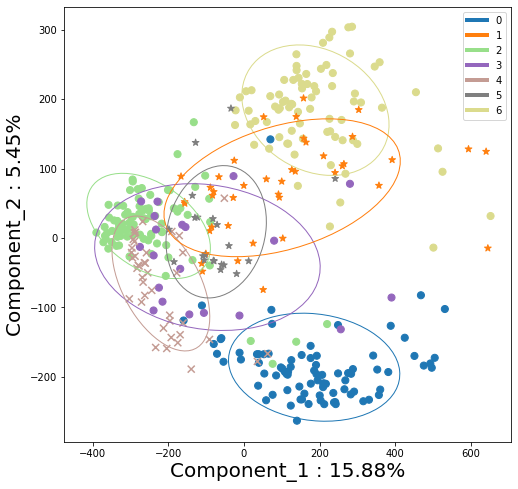

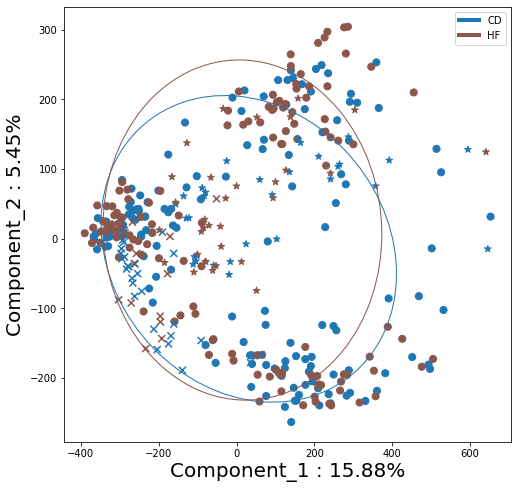

In [38]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


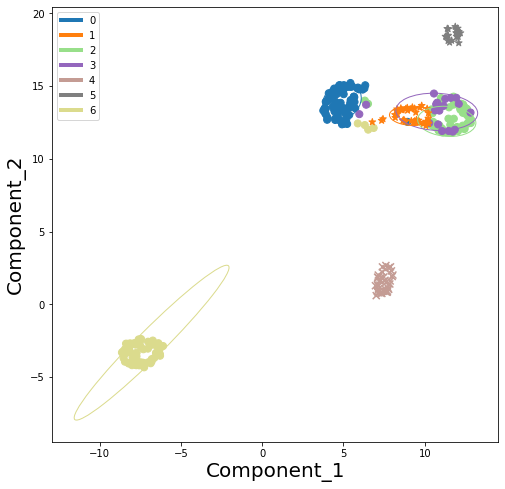

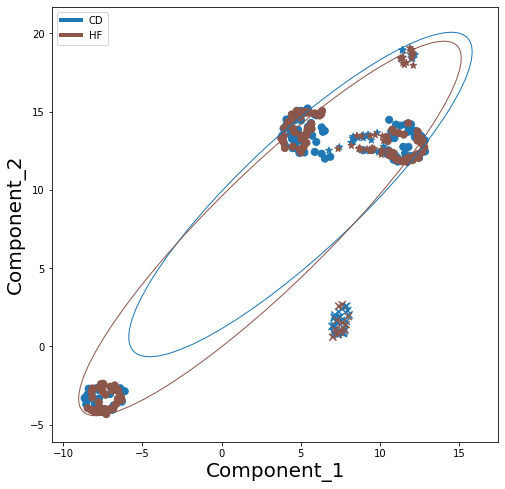

In [39]:
%matplotlib inline
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [40]:
if train_models:
    train_linsvc(data, 'raw', n_meta)
    train_rfc(data, 'raw', n_meta)
    # train_logreg(data, 'raw', n_meta)

In [41]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    table = pd.DataFrame(columns=cols, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        # print(col, f'pool {row}', metrics[row]['all_pool'][col]["domains"])
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['all'][col]

table

,pval,n
CD_HF,0.0,2369.0


In [42]:
def scale_data_per_batch(scale, data, device='cpu'):
    unique_batches = np.unique(data['batches']['all'])
    if scale == 'robust':
        scalers = {b: RobustScaler() for b in unique_batches}
        for b in unique_batches:
            mask = data['batches']['all'] == b
            scalers[b].fit(data['inputs']['all'][mask])
            for group in list(data['inputs'].keys()):
                if data['inputs'][group].shape[0] > 0:
                    mask = data['batches'][group] == b
                    # columns = data['inputs'][group][mask].columns
                    # indices = data['inputs'][group][mask].index
                    if data['inputs'][group][mask].shape[0] > 0:
                        data['inputs'][group].iloc[mask] = scalers[b].transform(data['inputs'][group][mask].to_numpy())
                    else:
                        data['inputs'][group][mask] = data['inputs'][group][mask]
            # data[data_type][group] = pd.DataFrame(data[data_type][group], columns=columns, index=indices)
        scaler = RobustScaler()
        scaler.fit(data['meta']['all'])
        for group in list(data['meta'].keys()):
            if data['meta'][group].shape[0] > 0:
                columns = data['meta'][group].columns
                indices = data['meta'][group].index
                if data['meta'][group].shape[0] > 0:
                    data['meta'][group] = scaler.transform(data['meta'][group].to_numpy())
                else:
                    data['meta'][group] = data['meta'][group]
                data['meta'][group] = pd.DataFrame(data['meta'][group], columns=columns, index=indices)

    elif scale == 'standard':
        scalers = {b: StandardScaler() for b in unique_batches}
        for b in unique_batches:
            mask = data['batches']['all'] == b
            scalers[b].fit(data['inputs']['all'][mask])
            for group in list(data['inputs'].keys()):
                if data['inputs'][group].shape[0] > 0:
                    mask = data['batches'][group] == b
                    # columns = data['inputs'][group][mask].columns
                    # indices = data['inputs'][group][mask].index
                    if data['inputs'][group][mask].shape[0] > 0:
                        data['inputs'][group].iloc[mask] = scalers[b].transform(data['inputs'][group][mask].to_numpy())
                    else:
                        data['inputs'][group][mask] = data['inputs'][group][mask]
            # data[data_type][group] = pd.DataFrame(data[data_type][group], columns=columns, index=indices)
        scaler = StandardScaler()
        scaler.fit(data['meta']['all'])
        for group in list(data['meta'].keys()):
            if data['meta'][group].shape[0] > 0:
                columns = data['meta'][group].columns
                indices = data['meta'][group].index
                if data['meta'][group].shape[0] > 0:
                    data['meta'][group] = scaler.transform(data['meta'][group].to_numpy())
                else:
                    data['meta'][group] = data['meta'][group]
                data['meta'][group] = pd.DataFrame(data['meta'][group], columns=columns, index=indices)

    elif scale == 'minmax':
        scalers = {b: MinMaxScaler() for b in unique_batches}
        for b in unique_batches:
            mask = data['batches']['all'] == b
            scalers[b].fit(data['inputs']['all'][mask])
            for group in list(data['inputs'].keys()):
                if data['inputs'][group].shape[0] > 0:
                    mask = data['batches'][group] == b
                    # columns = data['inputs'][group][mask].columns
                    # indices = data['inputs'][group][mask].index
                    if data['inputs'][group][mask].shape[0] > 0:
                        data['inputs'][group].iloc[mask] = scalers[b].transform(data['inputs'][group][mask].to_numpy())
                    else:
                        data['inputs'][group][mask] = data['inputs'][group][mask]
            # data[data_type][group] = pd.DataFrame(data[data_type][group], columns=columns, index=indices)
        scaler = MinMaxScaler()
        scaler.fit(data['meta']['all'])
        for group in list(data['meta'].keys()):
            if data['meta'][group].shape[0] > 0:
                columns = data['meta'][group].columns
                indices = data['meta'][group].index
                if data['meta'][group].shape[0] > 0:
                    data['meta'][group] = scaler.transform(data['meta'][group].to_numpy())
                else:
                    data['meta'][group] = data['meta'][group]
                data['meta'][group] = pd.DataFrame(data['meta'][group], columns=columns, index=indices)

    elif scale == 'none':
        return data
    # Values put on [0, 1] interval to facilitate autoencoder reconstruction (enable use of sigmoid as final activation)
    # scaler = MinMaxScaler()
    # scaler.fit(data['inputs']['all'])
    # for group in list(data['inputs'].keys()):
    #     if data['inputs'][group].shape[0] > 0:
    #         columns = data['inputs'][group].columns
    #         indices = data['inputs'][group].index
    #         if data['inputs'][group].shape[0] > 0:
    #             data['inputs'][group] = scaler.transform(data['inputs'][group].to_numpy())
    #         else:
    #             data['inputs'][group] = data['inputs'][group]
    #         data['inputs'][group] = pd.DataFrame(data['inputs'][group], columns=columns, index=indices)

    return data, scaler




# Minmax

In [43]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=1)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('minmax', data, device='cpu')

ValueError: too many values to unpack (expected 2)

In [ ]:
data['inputs']['all']

,10_AAAQTLER_2,100_AADAHVDAHYYEQNEQPTGTC(UniMod:4)AAC(UniMod:4)ITGGNR_4,100_AANEAGYFNEEMAPIEVK_3,10000_NSSYFVEWIPNNVK_2,100017_PAINVGLSVSR_2,10004_NSTLTFVTMSGELK_2,10006_NSVSQISVLSGGK_2,10007_NSVVEASEAAYK_2,10008_NSWGEPWGEK_2,10009_NSWGSNWGESGYFR_2,...,9990_NSNLVGAAHEELQQSR_3,9992_NSQEVGTYMLLK_2,9994_NSRPEANEALER_2,9995_NSRPEANEALER_3,9996_NSSHAGAFVIVTEEAIAK_3,99964_NYQQNYQNSESGEKNEGSESAPEGQAQQR_3,9997_NSSQAVQAVR_2,99982_NYVTPVNR_2,9999_NSSVGLIQLNRPK_2,99992_PAAVVLQTK_2
I170925_BXD66_HF_ET1560_SW_Run001,0.878136,0.607830,0.928273,0.571350,0.958575,0.867727,0.888395,0.602232,0.877477,0.000000,...,0.000000,0.915501,0.000000,0.627050,0.000000,0.804711,0.908287,0.898612,0.734392,0.915608
I170925_BXD101_CD_ET1424_SW_Run002,0.850093,0.305856,0.859910,0.520556,0.929032,0.839324,0.907150,0.552668,0.900822,0.000000,...,0.900131,0.827909,0.000000,0.462948,0.000000,0.767084,0.799000,0.904509,0.569899,0.884864
I170925_BXD63_HF_ET1715_SW_Run003,0.872668,0.566659,0.922260,0.567388,0.948753,0.869283,0.857505,0.511349,0.871111,0.000000,...,0.000000,0.890514,0.000000,0.481429,0.000000,0.000000,0.901660,0.893078,0.715078,0.882732
I170925_BXD61_HF_ET1721_SW_Run004,0.901131,0.641194,0.910051,0.640138,0.947693,0.865882,0.881371,0.567828,0.889682,0.876002,...,0.000000,0.905878,0.897224,0.554359,0.000000,0.000000,0.930227,0.889139,0.730270,0.896932
I170925_BXD61_CD_ET1725_SW_Run005,0.914557,0.617952,0.915753,0.685631,0.959371,0.875849,0.903401,0.632146,0.900234,0.901640,...,0.000000,0.879624,0.000000,0.598245,0.000000,0.836897,0.899045,0.907928,0.723425,0.894034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
I171123_Run408_BXD40_CD_ET680fix,0.860828,0.333316,0.897293,0.115107,0.905800,0.830539,0.856699,0.464633,0.900121,0.000000,...,0.928318,0.843199,0.000000,0.408362,0.835760,0.000000,0.870846,0.865600,0.592048,0.872575
I171123_Run411_BXD40_CD_ET1058,0.888712,0.458439,0.912007,0.228119,0.862268,0.817434,0.853090,0.435152,0.898031,0.829698,...,0.900903,0.840493,0.000000,0.465588,0.000000,0.000000,0.878527,0.855546,0.496705,0.000000
I171124_Run414_BXD73_HF_ET1506,0.908837,0.544198,0.920819,0.287541,0.808511,0.834941,0.890554,0.406171,0.922711,0.874932,...,0.931873,0.848955,0.000000,0.618752,0.860297,0.000000,0.888283,0.891188,0.489611,0.000000
I171124_Run415_BXD73_HF_ET1506,0.914544,0.610624,0.924496,0.183259,0.798977,0.823430,0.891288,0.462534,0.902672,0.877629,...,0.926880,0.869694,0.000000,0.727076,0.887416,0.000000,0.894664,0.906432,0.297927,0.000000


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'minmax')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'minmax', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'minmax')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  ----------  ----
CD_HF  8.7358e-38  2901
-----  ----------  ----
ttests
-----  -----------  ----
CD_HF  7.43101e-34  2369
-----  -----------  ----


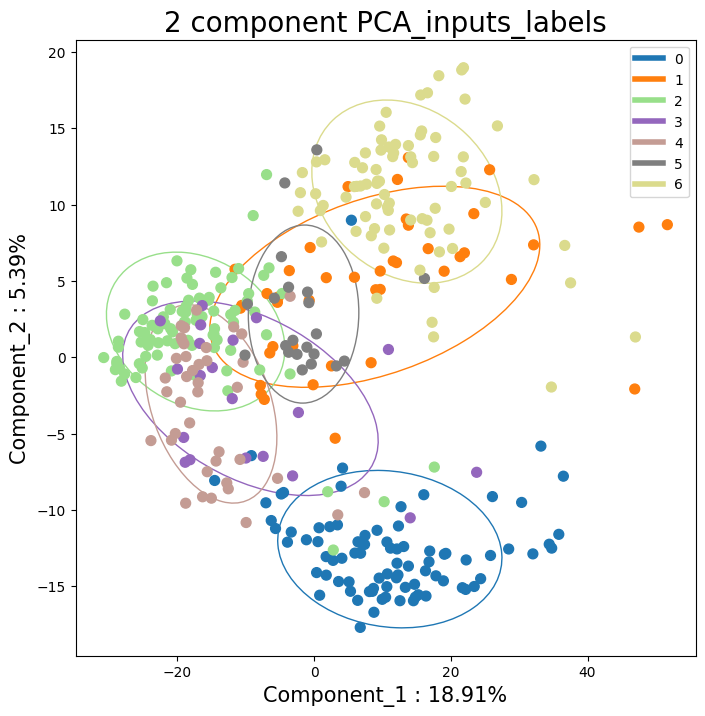

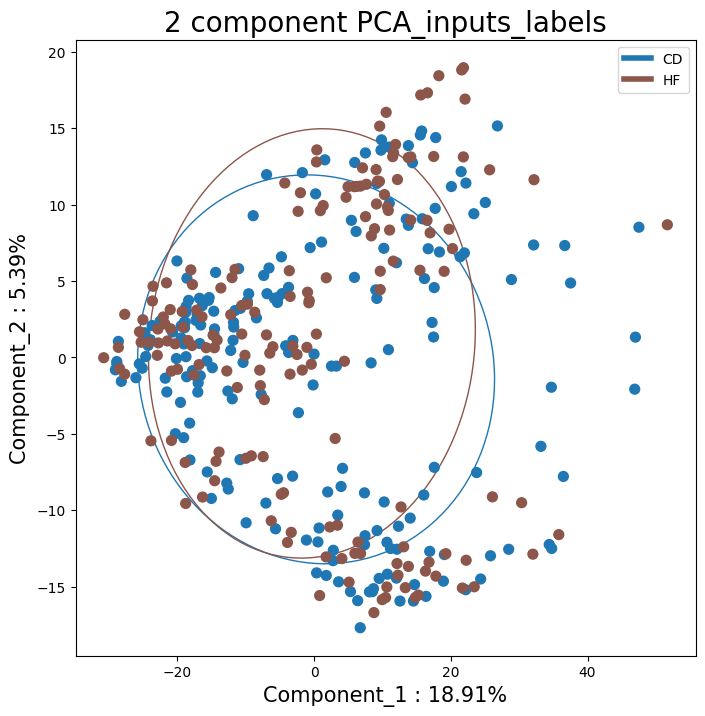

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_linsvc(data, 'minmax', n_meta)
    train_rfc(data, 'minmax', n_meta)
    # train_logreg(data, 'minmax', n_meta)

Iteration: 1
-1
valid_score: 0.9595238095238097 h_params: {'tol': 0.9744044165384433, 'max_iter': 933, 'penalty': 'l2', 'C': 9990.405154200935, 'class_weight': 'balanced'}
results/mice/mice/minmax/linsvc/0
Iteration: 2
[1.0, 1.0, 0.9285714285714286, 0.9285714285714286, 0.9404761904761905]
valid_score: 0.9690476190476192 h_params: {'tol': 0.0038576507737700483, 'max_iter': 389, 'penalty': 'l2', 'C': 9355.39077252125, 'class_weight': 'balanced'}
results/mice/mice/minmax/linsvc/0
Iteration: 3
[1.0, 1.0, 0.9523809523809523, 0.9404761904761905, 0.9523809523809523]
valid_score: 0.9690476190476192 h_params: {'tol': 0.0017909937393907646, 'max_iter': 525, 'penalty': 'l2', 'C': 2295.7729077210424, 'class_weight': 'balanced'}
Iteration: 4
[1.0, 1.0, 0.9523809523809523, 0.9404761904761905, 0.9523809523809523]
valid_score: 0.9690476190476192 h_params: {'tol': 0.4527391991788818, 'max_iter': 458, 'penalty': 'l2', 'C': 9391.27795510847, 'class_weight': 'balanced'}
Iteration: 5
[1.0, 1.0, 0.952380952

# Minmax per batch

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('minmax_per_batch', data, device='cpu')

In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'minmax')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'minmax_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'minmax')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  ----
CD_HF  5.99839e-34  7205
-----  -----------  ----
ttests
-----  -----------  ----
CD_HF  2.48837e-43  5360
-----  -----------  ----


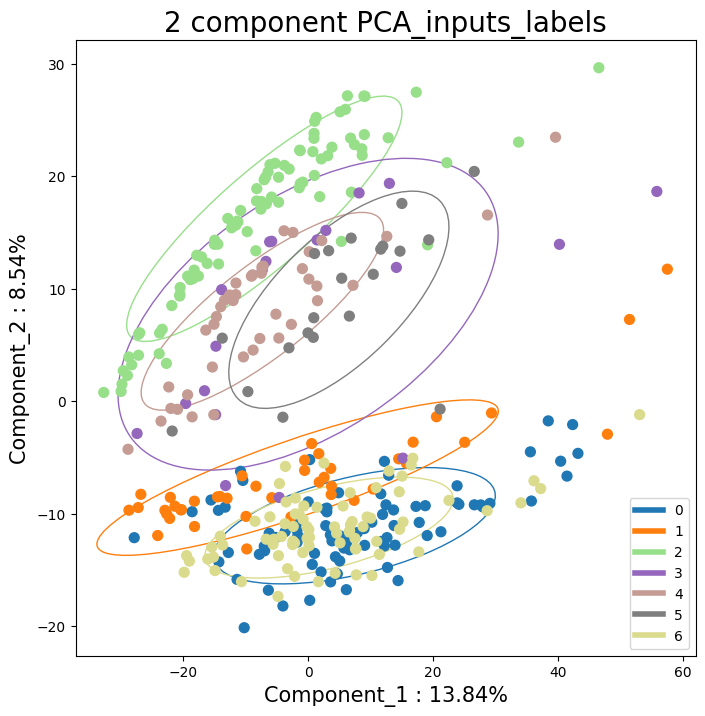

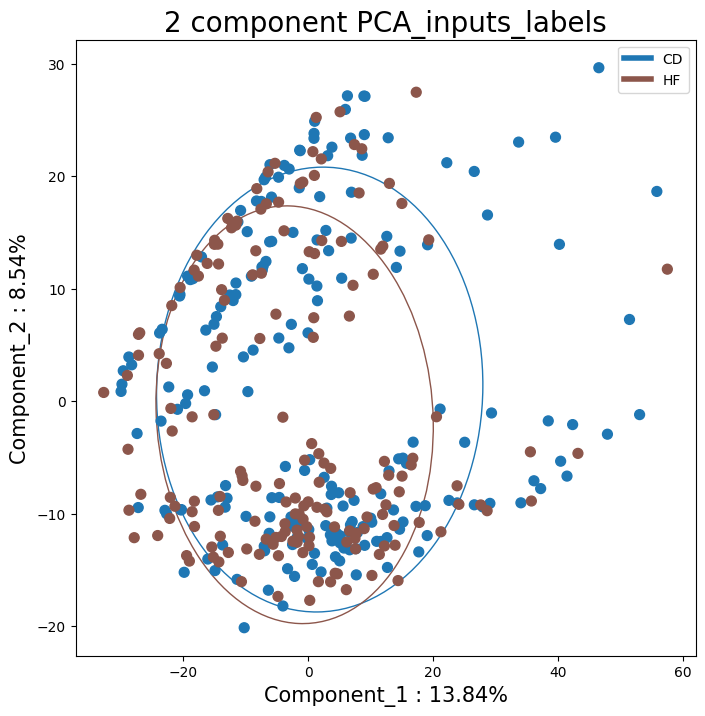

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
train_models

True

In [ ]:
if train_models:
    train_rfc(data, 'minmax_per_batch', n_meta)
    train_linsvc(data, 'minmax_per_batch', n_meta)
    # train_logreg(data, 'minmax', n_meta)

Iteration: 1
-1
valid_score: 0.9404761904761905 h_params: {'max_features': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'n_estimators': 999, 'criterion': 'entropy', 'oob_score': False, 'class_weight': 'balanced'}
results/mice/mice/minmax_per_batch/rfc/0
Iteration: 2
[1.0, 1.0, 0.9166666666666666, 0.8809523809523809, 0.9047619047619048]
valid_score: 0.9333333333333333 h_params: {'max_features': 67, 'min_samples_split': 9, 'min_samples_leaf': 9, 'n_estimators': 314, 'criterion': 'gini', 'oob_score': False, 'class_weight': 'balanced'}
Iteration: 3
[1.0, 1.0, 0.9166666666666666, 0.8809523809523809, 0.9047619047619048]
valid_score: 0.920879526977088 h_params: {'max_features': 54, 'min_samples_split': 9, 'min_samples_leaf': 5, 'n_estimators': 431, 'criterion': 'gini', 'oob_score': True, 'class_weight': 'balanced'}
Iteration: 4
[1.0, 1.0, 0.9166666666666666, 0.8809523809523809, 0.9047619047619048]
valid_score: 0.9280223841199451 h_params: {'max_features': 80, 'min_samples_split': 3, 'm

# Standard

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'standard')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'standard', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'standard')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  ----------  ----
CD_HF  8.7358e-38  2901
-----  ----------  ----
ttests
-----  -----------  ----
CD_HF  7.43101e-34  2369
-----  -----------  ----


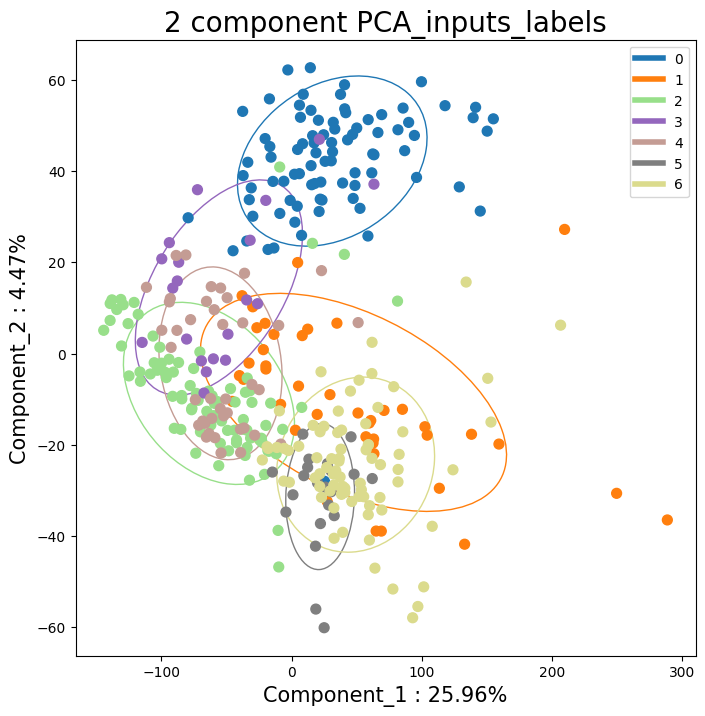

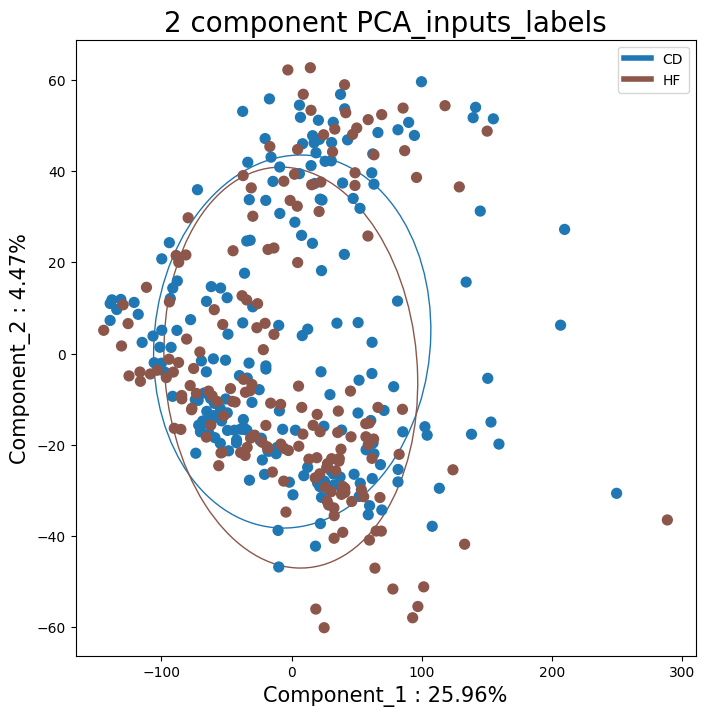

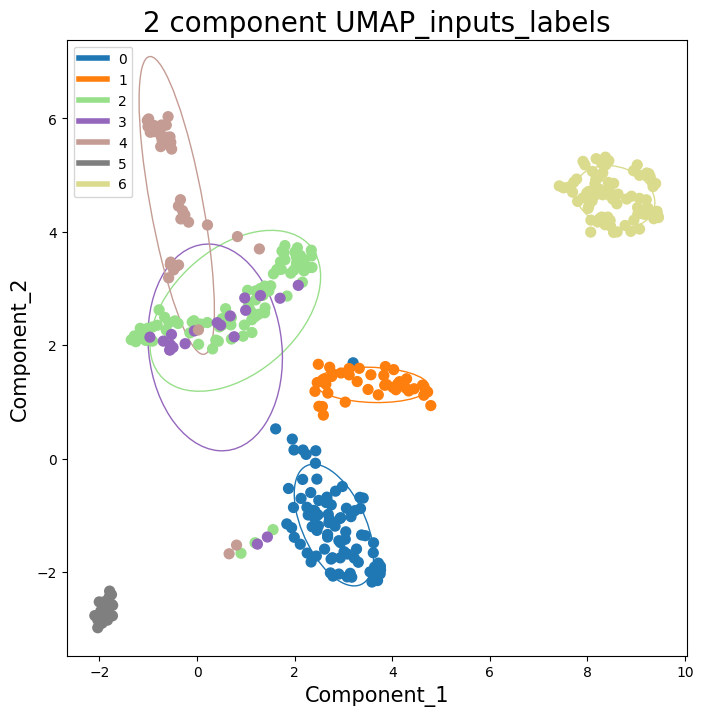

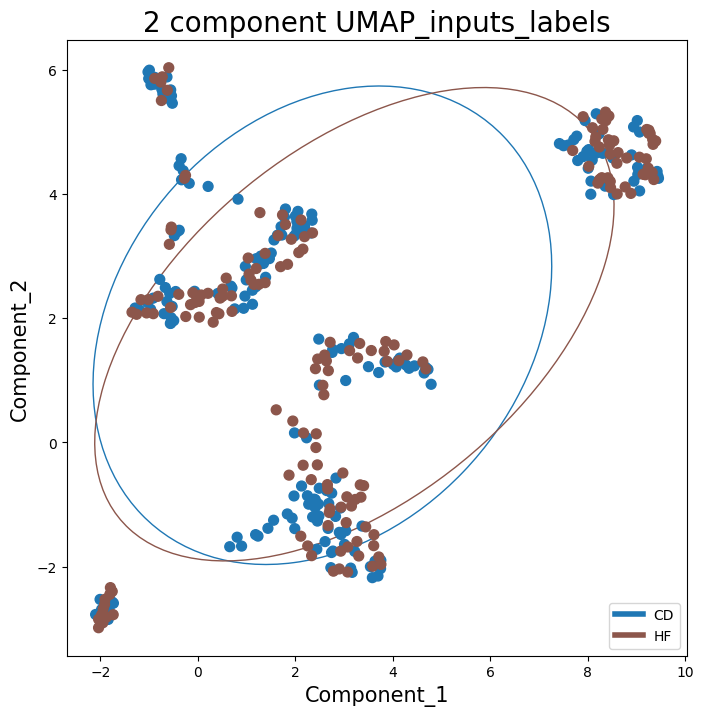

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)

log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_linsvc(data, 'standard', n_meta)
    train_rfc(data, 'standard', n_meta)
    # train_logreg(data, 'standard', n_meta)

Iteration: 1
-1
valid_score: 0.9567099567099568 h_params: {'tol': 0.9744044165384433, 'max_iter': 933, 'penalty': 'l2', 'C': 9990.405154200935, 'class_weight': 'balanced'}
results/mice/mice/standard/linsvc/0
Iteration: 2
[0.974025974025974, 1.0, 0.9404761904761905, 0.9404761904761905, 0.9285714285714286]
valid_score: 0.9470700031675643 h_params: {'tol': 0.0038576507737700483, 'max_iter': 389, 'penalty': 'l2', 'C': 9355.39077252125, 'class_weight': 'balanced'}
Iteration: 3
[0.974025974025974, 1.0, 0.9404761904761905, 0.9404761904761905, 0.9285714285714286]
valid_score: 0.9470700031675643 h_params: {'tol': 0.0017909937393907646, 'max_iter': 525, 'penalty': 'l2', 'C': 2295.7729077210424, 'class_weight': 'balanced'}
Iteration: 4
[0.974025974025974, 1.0, 0.9404761904761905, 0.9404761904761905, 0.9285714285714286]
valid_score: 0.9496674057649669 h_params: {'tol': 0.4527391991788818, 'max_iter': 458, 'penalty': 'l2', 'C': 9391.27795510847, 'class_weight': 'balanced'}
Iteration: 5
[0.974025974

# Standard per batch

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard_per_batch', data, device='cpu')

In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'standard')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'standard_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'standard')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  ----
CD_HF  2.19562e-36  8063
-----  -----------  ----
ttests
-----  -----------  ----
CD_HF  2.14916e-44  6812
-----  -----------  ----


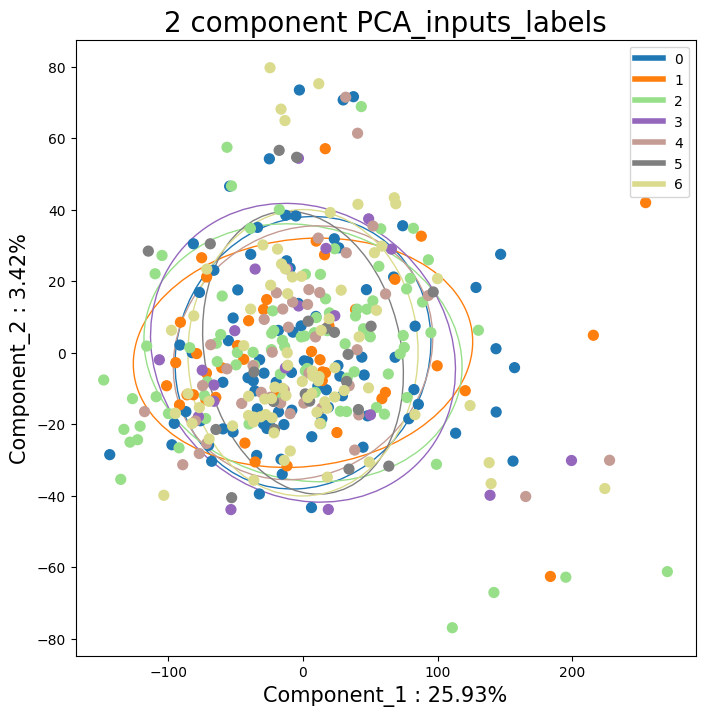

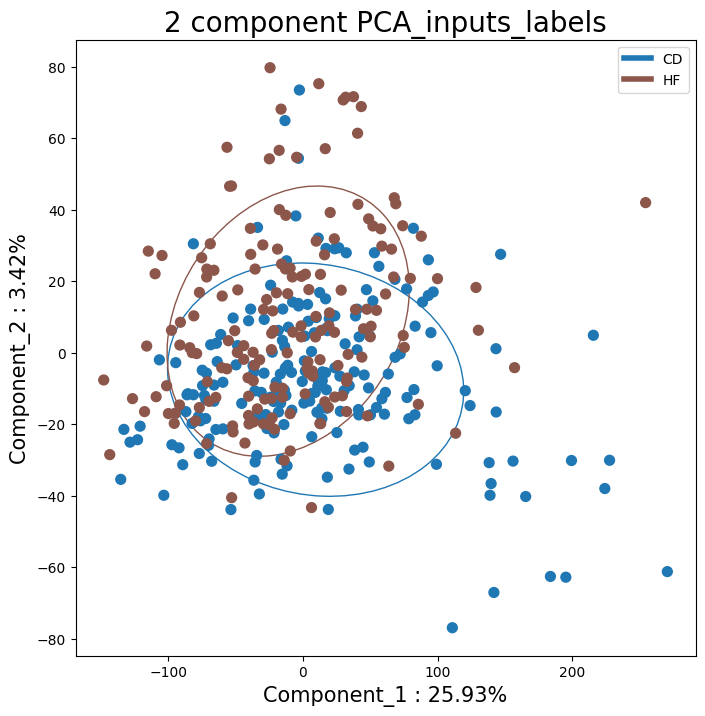

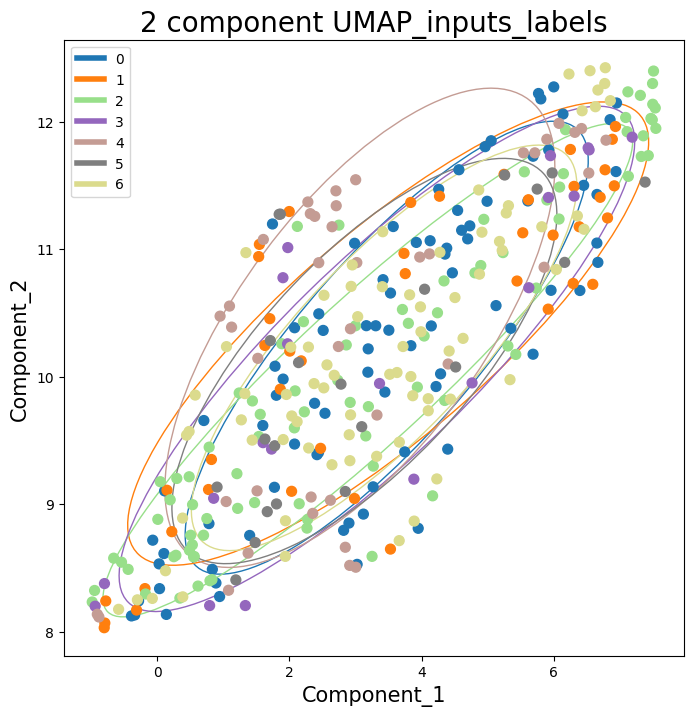

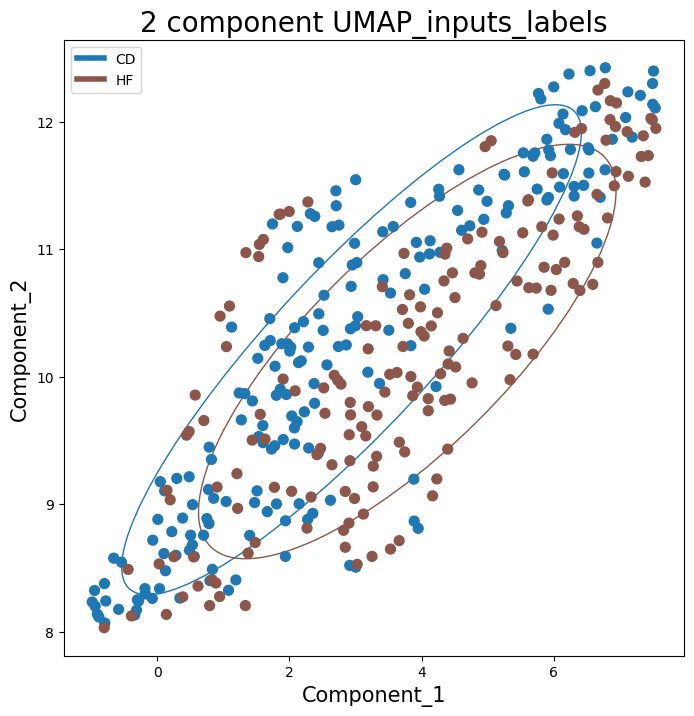

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)

log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_rfc(data, 'standard_per_batch', n_meta)
    train_linsvc(data, 'standard_per_batch', n_meta)
    # train_logreg(data, 'standard', n_meta)

Iteration: 1
-1
valid_score: 0.9392777953753562 h_params: {'max_features': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'n_estimators': 999, 'criterion': 'entropy', 'oob_score': False, 'class_weight': 'balanced'}
results/mice/mice/standard_per_batch/rfc/0
Iteration: 2
[0.935064935064935, 0.975609756097561, 0.9404761904761905, 0.9166666666666666, 0.9285714285714286]
valid_score: 0.9296536796536797 h_params: {'max_features': 67, 'min_samples_split': 9, 'min_samples_leaf': 9, 'n_estimators': 314, 'criterion': 'gini', 'oob_score': False, 'class_weight': 'balanced'}
Iteration: 3
[0.935064935064935, 0.975609756097561, 0.9404761904761905, 0.9166666666666666, 0.9285714285714286]
valid_score: 0.9322510822510821 h_params: {'max_features': 54, 'min_samples_split': 9, 'min_samples_leaf': 5, 'n_estimators': 431, 'criterion': 'gini', 'oob_score': True, 'class_weight': 'balanced'}
Iteration: 4
[0.935064935064935, 0.975609756097561, 0.9404761904761905, 0.9166666666666666, 0.9285714285714286]
va

# Robust

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('robust', data, device='cpu')

sel = VarianceThreshold(threshold=0.16)
sel.fit(data['inputs']['all'])
features = np.array([int(x.split('x')[1]) for x in sel.get_feature_names_out()])
data['inputs']['all'] = data['inputs']['all'].iloc[:, features]
data['inputs']['all_pool'] = data['inputs']['all_pool'].iloc[:, features]
data['inputs']['train'] = data['inputs']['train'].iloc[:, features]
data['inputs']['train_pool'] = data['inputs']['train_pool'].iloc[:, features]
data['inputs']['valid'] = data['inputs']['valid'].iloc[:, features]
data['inputs']['valid_pool'] = data['inputs']['valid_pool'].iloc[:, features]
data['inputs']['test'] = data['inputs']['test'].iloc[:, features]
data['inputs']['test_pool'] = data['inputs']['test_pool'].iloc[:, features]

In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'robust')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'robust', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'robust')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  ----------  ----
CD_HF  8.7358e-38  2901
-----  ----------  ----
ttests
-----  -----------  ----
CD_HF  7.43101e-34  2369
-----  -----------  ----


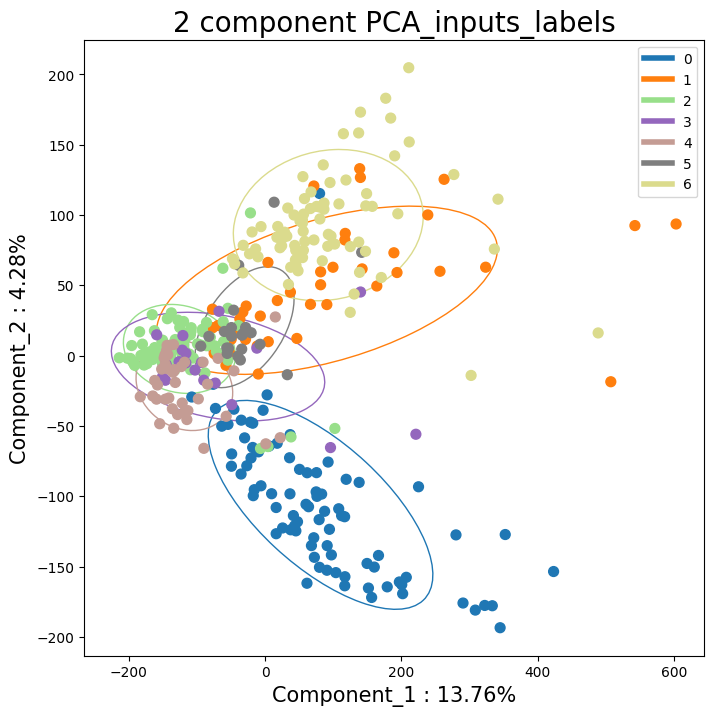

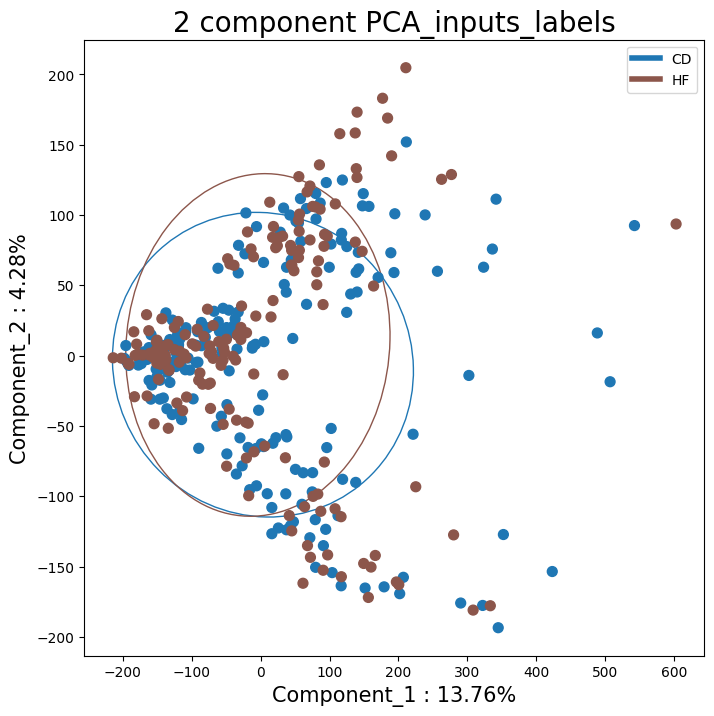

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_linsvc(data, 'robust', n_meta)
    train_rfc(data, 'robust', n_meta)
    # train_logreg(data, 'robust', n_meta)

Iteration: 1
-1
valid_score: 0.9447735191637632 h_params: {'tol': 0.9744044165384433, 'max_iter': 933, 'penalty': 'l2', 'C': 9990.405154200935, 'class_weight': 'balanced'}
results/mice/mice/robust/linsvc/0
Iteration: 2
[1.0, 0.9024390243902439, 0.9404761904761905, 0.9404761904761905, 0.9404761904761905]
valid_score: 0.9400116144018582 h_params: {'tol': 0.0038576507737700483, 'max_iter': 389, 'penalty': 'l2', 'C': 9355.39077252125, 'class_weight': 'balanced'}
Iteration: 3
[1.0, 0.9024390243902439, 0.9404761904761905, 0.9404761904761905, 0.9404761904761905]
valid_score: 0.9400116144018582 h_params: {'tol': 0.0017909937393907646, 'max_iter': 525, 'penalty': 'l2', 'C': 2295.7729077210424, 'class_weight': 'balanced'}
Iteration: 4
[1.0, 0.9024390243902439, 0.9404761904761905, 0.9404761904761905, 0.9404761904761905]
valid_score: 0.9400116144018582 h_params: {'tol': 0.4527391991788818, 'max_iter': 458, 'penalty': 'l2', 'C': 9391.27795510847, 'class_weight': 'balanced'}
Iteration: 5
[1.0, 0.902

# Robust per batch

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('robust_per_batch', data, device='cpu')

sel = VarianceThreshold(threshold=0.16)
sel.fit(data['inputs']['all'])
features = np.array([int(x.split('x')[1]) for x in sel.get_feature_names_out()])
data['inputs']['all'] = data['inputs']['all'].iloc[:, features]
data['inputs']['all_pool'] = data['inputs']['all_pool'].iloc[:, features]
data['inputs']['train'] = data['inputs']['train'].iloc[:, features]
data['inputs']['train_pool'] = data['inputs']['train_pool'].iloc[:, features]
data['inputs']['valid'] = data['inputs']['valid'].iloc[:, features]
data['inputs']['valid_pool'] = data['inputs']['valid_pool'].iloc[:, features]
data['inputs']['test'] = data['inputs']['test'].iloc[:, features]
data['inputs']['test_pool'] = data['inputs']['test_pool'].iloc[:, features]

In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'robust')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'robust_per_batch', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'robust')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  ----
CD_HF  1.02546e-36  9196
-----  -----------  ----
ttests
-----  -----------  ----
CD_HF  2.01502e-38  3956
-----  -----------  ----


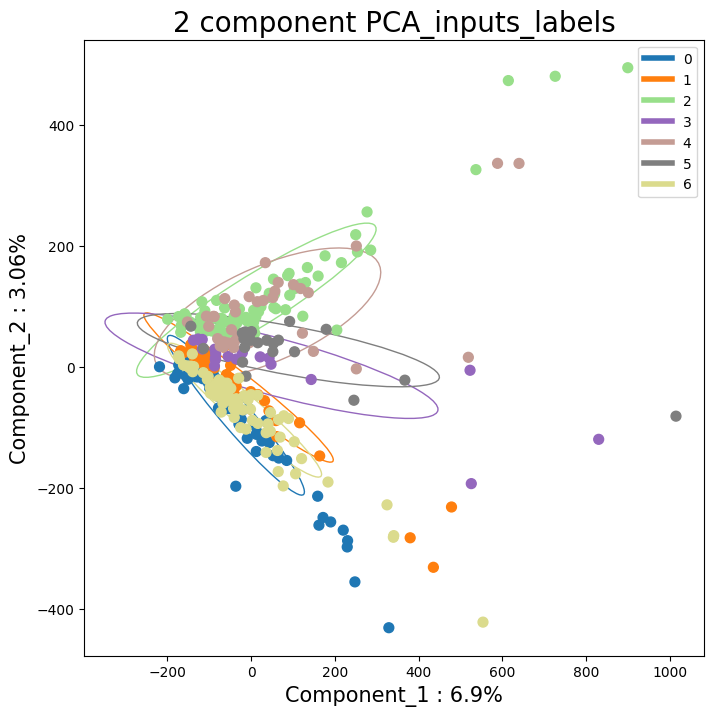

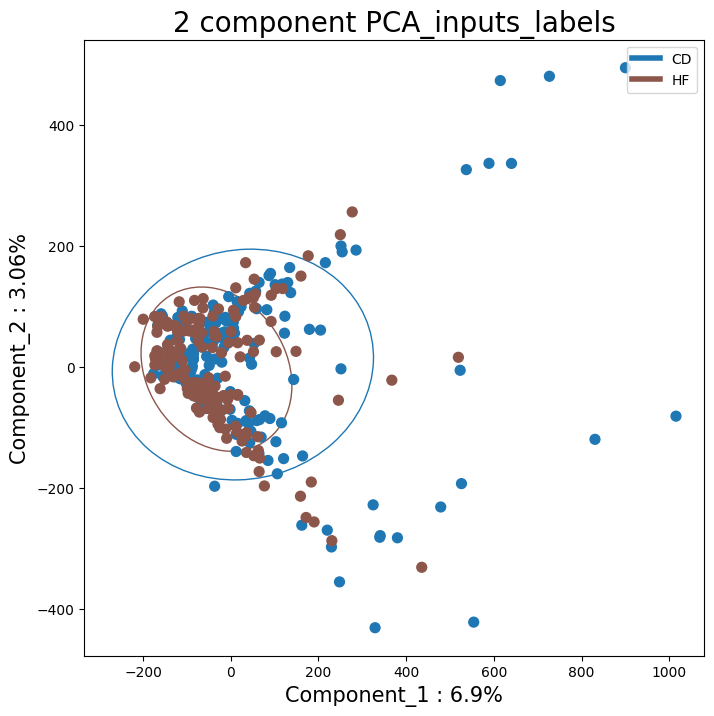

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if train_models:
    train_linsvc(data, 'robust_per_batch', n_meta)
    train_rfc(data, 'robust_per_batch', n_meta)
    # train_logreg(data, 'robust', n_meta)

Iteration: 1
-1
valid_score: 0.9177330799282017 h_params: {'tol': 0.9744044165384433, 'max_iter': 933, 'penalty': 'l2', 'C': 9990.405154200935, 'class_weight': 'balanced'}
results/mice/mice/robust_per_batch/linsvc/0
Iteration: 2
[0.935064935064935, 0.9512195121951219, 0.9047619047619048, 0.8928571428571429, 0.9047619047619048]
valid_score: 0.9177330799282017 h_params: {'tol': 0.0038576507737700483, 'max_iter': 389, 'penalty': 'l2', 'C': 9355.39077252125, 'class_weight': 'balanced'}
Iteration: 3
[0.935064935064935, 0.9512195121951219, 0.9047619047619048, 0.8928571428571429, 0.9047619047619048]
valid_score: 0.9177330799282017 h_params: {'tol': 0.0017909937393907646, 'max_iter': 525, 'penalty': 'l2', 'C': 2295.7729077210424, 'class_weight': 'balanced'}
Iteration: 4
[0.935064935064935, 0.9512195121951219, 0.9047619047619048, 0.8928571428571429, 0.9047619047619048]
valid_score: 0.9177330799282017 h_params: {'tol': 0.4527391991788818, 'max_iter': 458, 'penalty': 'l2', 'C': 9391.27795510847, 

# Combat

In [ ]:
path='data'
data, unique_labels, unique_batches = get_mice(path, remove_zeros=0, groupkfold=1, seed=1)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data = remove_batch_effect(get_berm('combat'), data)

not with classes!


R[write to console]: Found7batches

R[write to console]: Adjusting for0covariate(s) or covariate level(s)

R[write to console]: Standardizing Data across genes

R[write to console]: Fitting L/S model and finding priors

R[write to console]: Finding parametric adjustments

R[write to console]: Adjusting the Data




train 0
valid 268
test 309


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  --------  -
CD_HF  0.963349  0
-----  --------  -
ttests
-----  --------  -
CD_HF  0.986707  0
-----  --------  -


inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


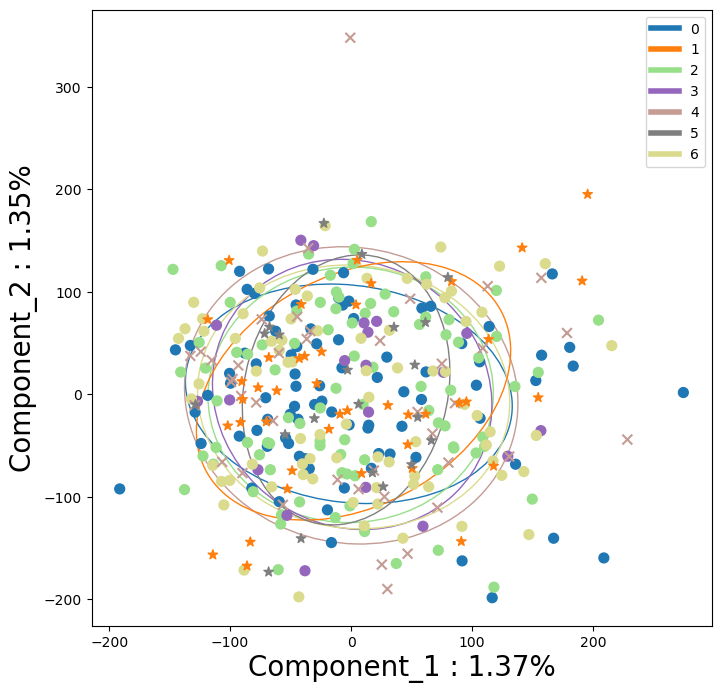

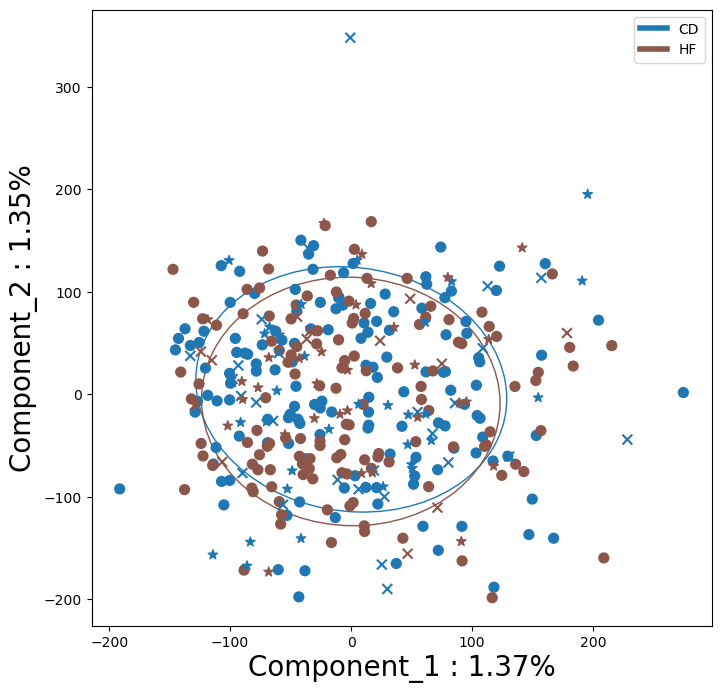

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


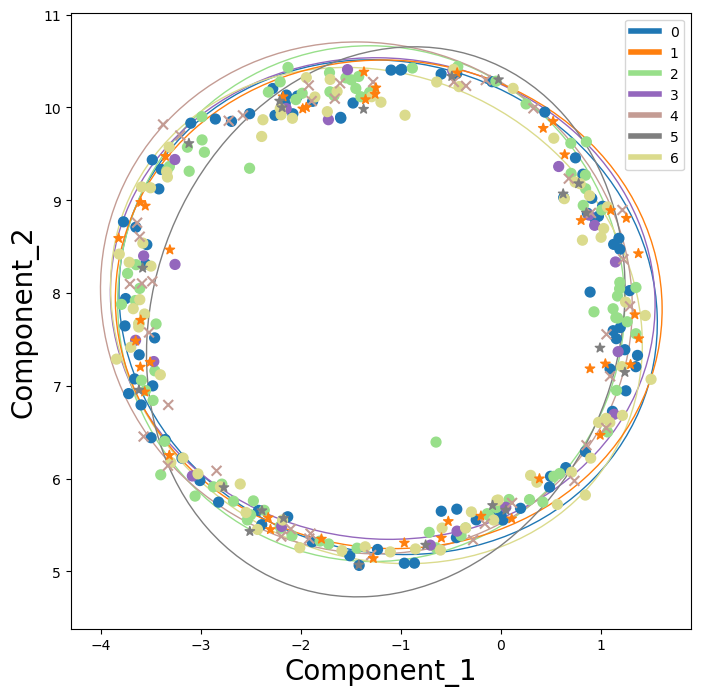

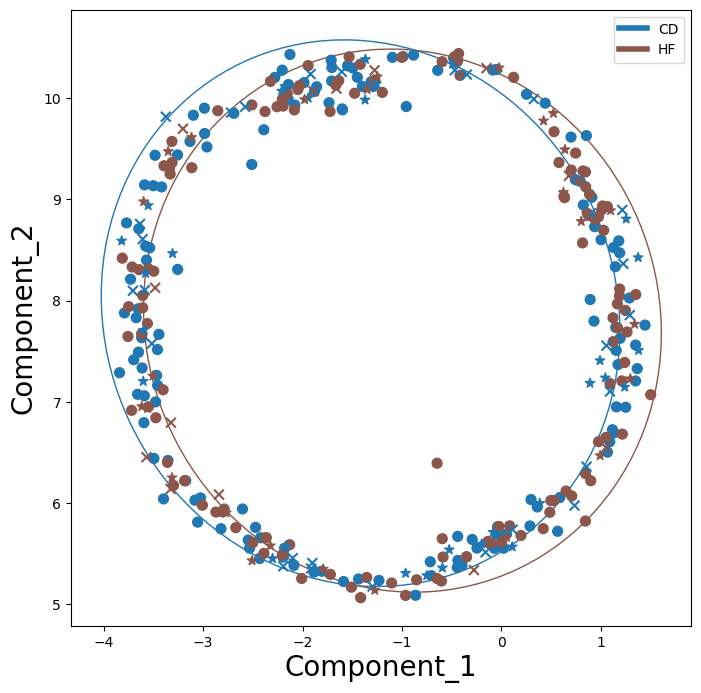

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'combat')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'combat', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'combat')

In [ ]:
if train_models:
    train_rfc(data, 'combat', n_meta)
    train_linsvc(data, 'combat', n_meta)
    # train_logreg(data, 'combat', n_meta)

Iteration: 1
-1
valid_score: 0.4802607961144546 h_params: {'tol': 0.9744044165384433, 'max_iter': 933, 'penalty': 'l2', 'C': 9990.405154200935, 'class_weight': 'balanced'}
results/mice/mice/combat/linsvc/0
Iteration: 2
[0.5194805194805194, 0.5365853658536586, 0.44047619047619047, 0.47619047619047616, 0.42857142857142855]
valid_score: 0.4997413155949742 h_params: {'tol': 0.0038576507737700483, 'max_iter': 389, 'penalty': 'l2', 'C': 9355.39077252125, 'class_weight': 'balanced'}
results/mice/mice/combat/linsvc/0
Iteration: 3
[0.5454545454545454, 0.5365853658536586, 0.4523809523809524, 0.5119047619047619, 0.4523809523809524]
valid_score: 0.4997413155949742 h_params: {'tol': 0.0017909937393907646, 'max_iter': 525, 'penalty': 'l2', 'C': 2295.7729077210424, 'class_weight': 'balanced'}
Iteration: 4
[0.5454545454545454, 0.5365853658536586, 0.4523809523809524, 0.5119047619047619, 0.4523809523809524]
valid_score: 0.5118625277161863 h_params: {'tol': 0.4527391991788818, 'max_iter': 458, 'penalty':

# pyCombat

In [ ]:
from combat.pycombat import pycombat
data, unique_labels = get_mice(path, remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data = use_pycombat(pycombat, data)


Found 7 batches.
Adjusting for 0 covariate(s) or covariate level(s).
Standardizing Data across genes.
Fitting L/S model and finding priors.
Finding parametric adjustments.
Adjusting the Data


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  ----
CD_HF  1.58454e-35  8382
-----  -----------  ----
ttests
-----  -----------  ----
CD_HF  1.40926e-44  6154
-----  -----------  ----


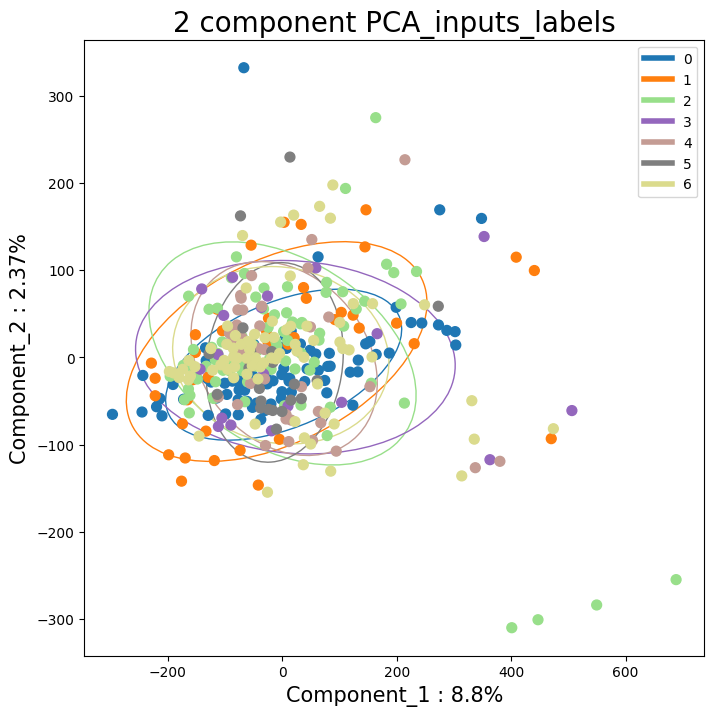

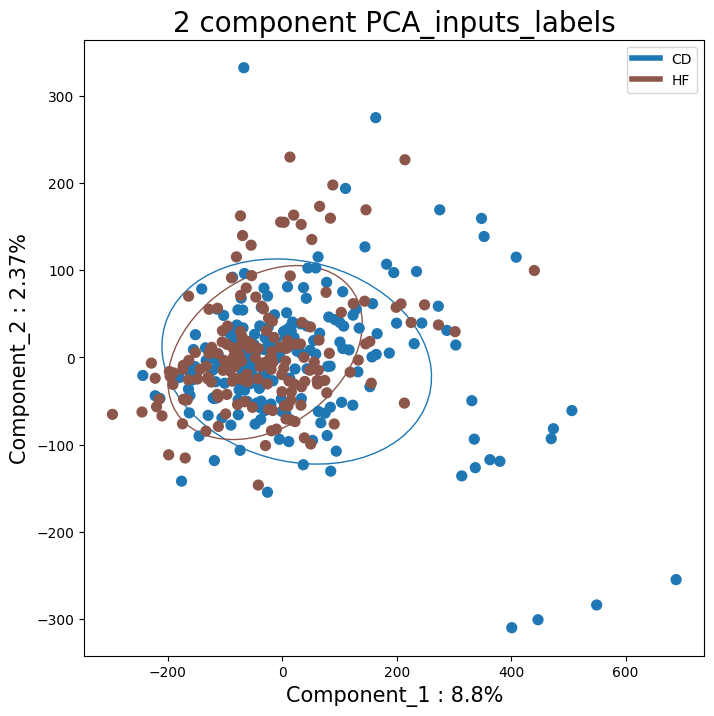

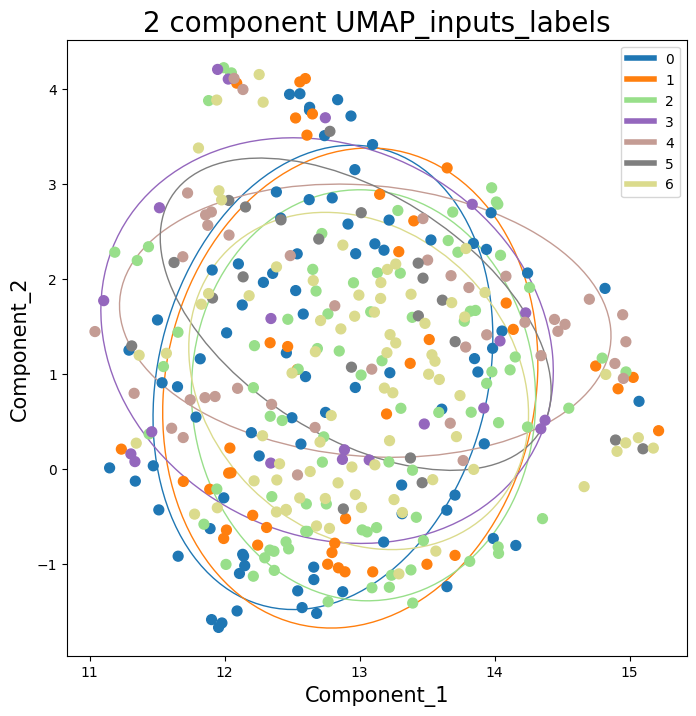

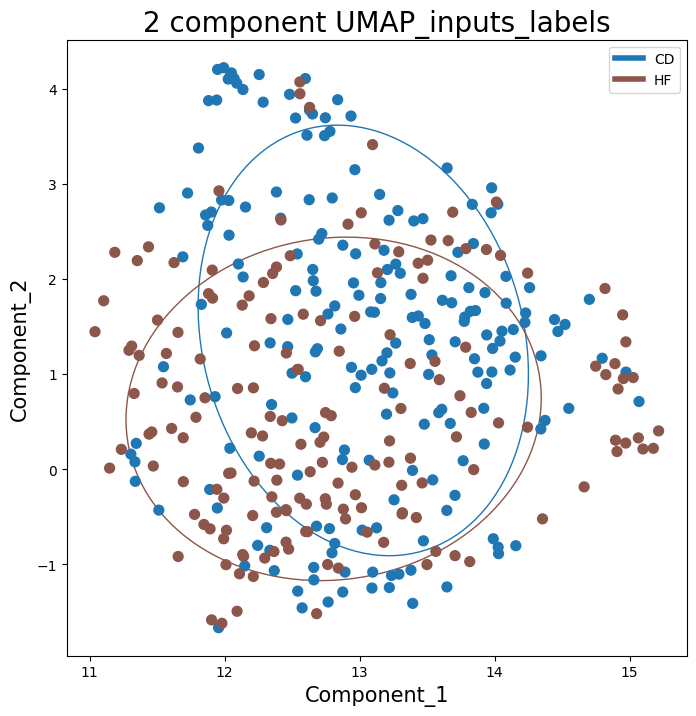

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels}, 0)


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'combat')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'pycombat', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'combat')

In [ ]:
if train_models:
    train_rfc(data, 'pycombat', n_meta)
    train_linsvc(data, 'pycombat', n_meta)
    # train_logreg(data, 'combat', n_meta)

Iteration: 1
-1
valid_score: 0.9448051948051948 h_params: {'max_features': 100, 'min_samples_split': 9, 'min_samples_leaf': 2, 'n_estimators': 999, 'criterion': 'entropy', 'oob_score': False, 'class_weight': 'balanced'}
results/mice/mice/pycombat/rfc/0
Iteration: 2
[0.974025974025974, 1.0, 0.9285714285714286, 0.9047619047619048, 0.9166666666666666]
valid_score: 0.9497835497835497 h_params: {'max_features': 67, 'min_samples_split': 9, 'min_samples_leaf': 9, 'n_estimators': 314, 'criterion': 'gini', 'oob_score': False, 'class_weight': 'balanced'}
results/mice/mice/pycombat/rfc/0
Iteration: 3
[0.987012987012987, 1.0, 0.9166666666666666, 0.9166666666666666, 0.9285714285714286]
valid_score: 0.9374458874458874 h_params: {'max_features': 54, 'min_samples_split': 9, 'min_samples_leaf': 5, 'n_estimators': 431, 'criterion': 'gini', 'oob_score': True, 'class_weight': 'balanced'}
Iteration: 4
[0.987012987012987, 1.0, 0.9166666666666666, 0.9166666666666666, 0.9285714285714286]
valid_score: 0.942640

# Harmony

In [ ]:
data, unique_labels = get_mice(path, remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

# data['inputs']['all'].iloc[:] = minmax_scaler.fit_transform(data['inputs']['all'])
# data['inputs']['train'].iloc[:] = minmax_scaler.transform(data['inputs']['train'])
# data['inputs']['valid'].iloc[:] = minmax_scaler.transform(data['inputs']['valid'])
# data['inputs']['test'].iloc[:] = minmax_scaler.transform(data['inputs']['test'])
data = remove_batch_effect(get_berm('harmony'), data)

R[write to console]: Error: element-wise multiplication: incompatible matrix dimensions: 12x7 and 12x1

R[write to console]: In addition: 
R[write to console]: There were 25 warnings (use warnings() to see them)
R[write to console]: 



RRuntimeError: Error: element-wise multiplication: incompatible matrix dimensions: 12x7 and 12x1


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'harmony')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'harmony', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'harmony')

In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages, 'gender': unique_genders}, 0)


In [ ]:
%matplotlib inline
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages, 'gender': unique_genders}, 0)


In [ ]:
if train_models:
    train_rfc(data, 'harmony', n_meta)
    train_linsvc(data, 'harmony', n_meta)
    # train_logreg(data, 'harmony', n_meta)

# WaveICA

In [ ]:
import pandas as pd
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter

def waveicaR(data, batches):
    with localconverter(robjects.default_converter + pandas2ri.converter):
        data_r = robjects.conversion.py2rpy(data)

    # data_r = robjects.r.matrix(robjects.FloatVector(df.values.reshape(-1)), nrow=df.shape[0])
    batches_r = robjects.IntVector(batches.reshape(-1))
    waveica = importr('WaveICA')
    # data_r.colnames = robjects.StrVector([str(x) for x in range(df.shape[1])])
    newdata = waveica.WaveICA(dat=data_r, batch=batches_r)
    with localconverter(robjects.default_converter + pandas2ri.converter):
        newdata = { key : np.array(robjects.conversion.rpy2py(newdata.rx2(key))) for key in newdata.names }
    return newdata['data_wave']


data, unique_labels = get_mice(path, remove_zeros=0, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

df = data['inputs']['all']
all_batches = data['batches']['all']
# assert np.sum(all_batches != np.concatenate((data['batches']['train'], data['batches']['valid'], data['batches']['test']))) == 0
tmp = waveicaR(df, all_batches)

In [ ]:
previous_len = 0
for g in list(data['inputs'].keys())[1:-1]:
    data['inputs'][g] = pd.DataFrame(
        tmp[previous_len:previous_len + data['inputs'][g].shape[0]],
        index=data['inputs'][g].index)
    previous_len += data['inputs'][g].shape[0]
try:
    data['inputs']['all'] = pd.DataFrame(tmp, index=df.index, columns=df.columns)
except:
    data['inputs']['all'] = pd.DataFrame(tmp, index=df.index)

if n_meta == 2:
    for group in data['inputs']:
        data['inputs'][group] = pd.DataFrame(np.concatenate((data['inputs'][group], data['meta'][group]), 1))


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label).squeeze()], 
                data['inputs']['all'].iloc[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages, 'gender': unique_genders}, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_inputs_labels'}, data, 
        {'batches': unique_batches, 'labels': unique_labels, 'age': unique_ages, 'gender': unique_genders}, 0)


In [ ]:
if log_stuff:
    metrics = log_pool_metrics(data['inputs'], data['batches'], metrics, 'waveica')
    metrics = log_metrics(data, unique_labels, data['batches'], metrics, 'waveica', device='cuda')
    # metrics = log_LDA(LDA, data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'waveica')

In [ ]:
if train_models:
    train_rfc(data, 'waveica', n_meta)
    train_linsvc(data, 'waveica', n_meta)
    # train_logreg(data, 'waveica', n_meta)
    

In [ ]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    table = pd.DataFrame(columns=cols, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        # print(col, f'pool {row}', metrics[row]['all_pool'][col]["domains"])
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['all'][col]

table

# AE 

In [ ]:
from src.dl.models.pytorch.aedann import AutoEncoder2 as AutoEncoder


## Encoded

In [ ]:
data, unique_labels, unique_batches = get_mice('data', remove_zeros=1, groupkfold=1, seed=1)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard_per_batch', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/no_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True, mapping=False)
enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True, mapping=False)

for group in enc_data['inputs']:
    enc_data['inputs'][group] = pd.DataFrame(enc_data['inputs'][group].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  1.42165e-59  61
-----  -----------  --
ttests
-----  -  --
CD_HF  0  61
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'ae-enc')


Exception ignored from cffi callback <function _callback at 0x00000248AD085AF0>:
Traceback (most recent call last):
  File "C:\Users\simon\anaconda3\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 329, in _callback
    try:
KeyboardInterrupt: 
Exception ignored from cffi callback <function _callback at 0x00000248AD085AF0>:
Traceback (most recent call last):
  File "C:\Users\simon\anaconda3\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 329, in _callback
    try:
KeyboardInterrupt: 
Exception ignored from cffi callback <function _callback at 0x00000248AD085AF0>:
Traceback (most recent call last):
  File "C:\Users\simon\anaconda3\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 329, in _callback
    try:
KeyboardInterrupt: 
Exception ignored from cffi callback <function _callback at 0x00000248AD085AF0>:
Traceback (most recent call last):
  File "C:\Users\simon\anaconda3\lib\site-packages\rpy2\rinterface_lib\callbacks.py", line 329, in _callback
    try:
Keyb

KeyboardInterrupt: 

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


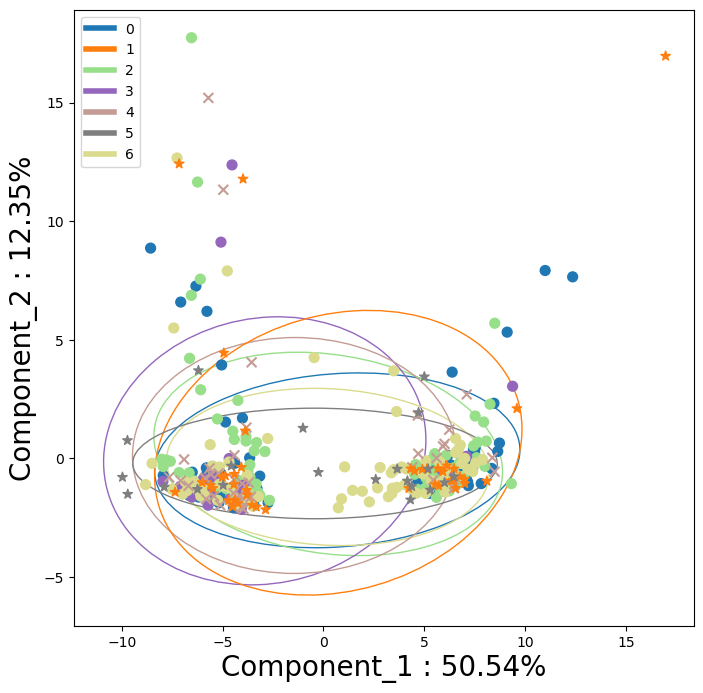

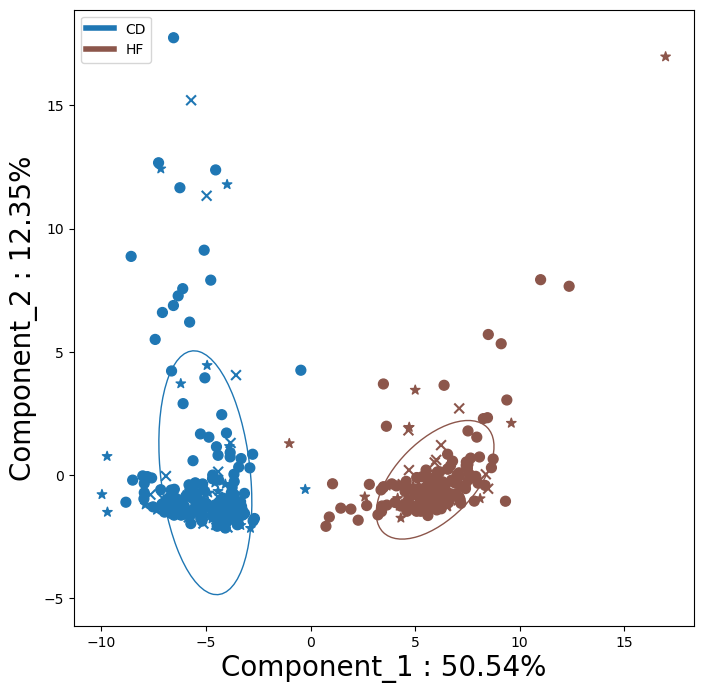

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


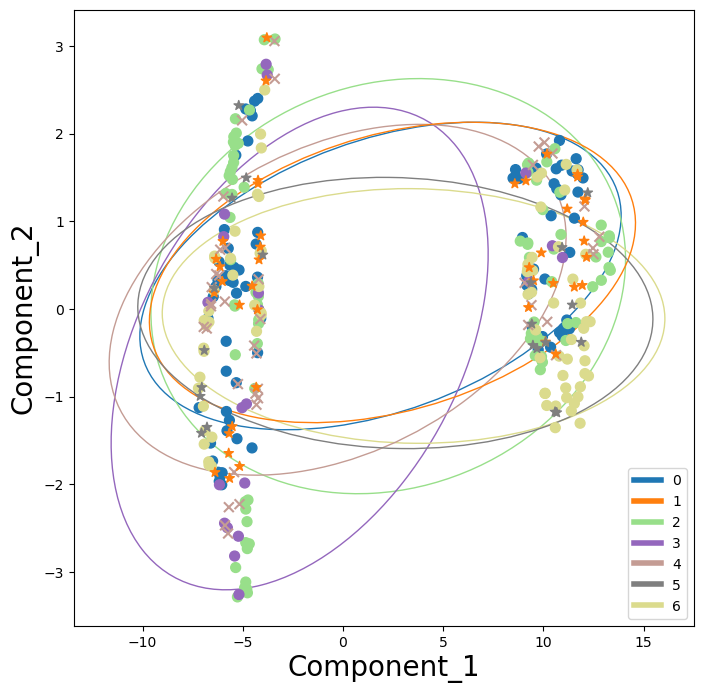

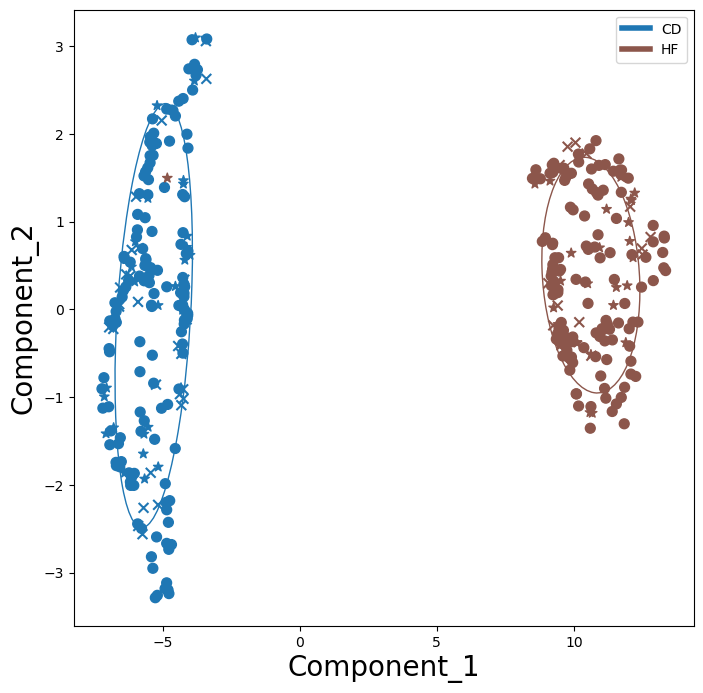

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-enc', n_meta)
    train_linsvc(enc_data, 'ae-enc', n_meta)
    # train_logreg(enc_data, 'ae-enc', n_meta)
    

# NORMAE 

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/normae_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)
# enc_data['inputs']['train'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['train'].values), batches, sampling=True)
# enc_data['inputs']['valid'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['valid'].values), batches, sampling=True)
# enc_data['inputs']['test'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['test'].values), batches, sampling=True)

# for group in enc_data['inputs']:
enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  1.11549e-57  63
-----  -----------  --
ttests
-----  -  --
CD_HF  0  63
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'normae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'normae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'ae-enc')


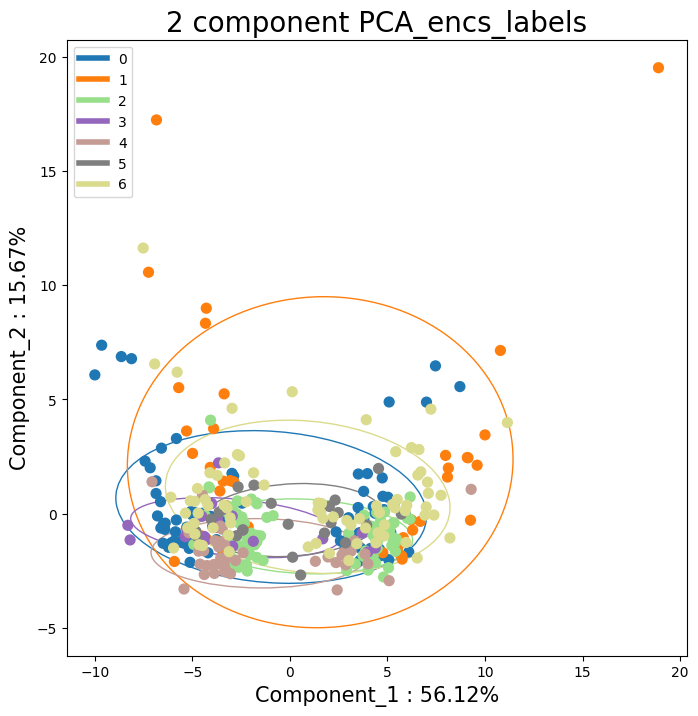

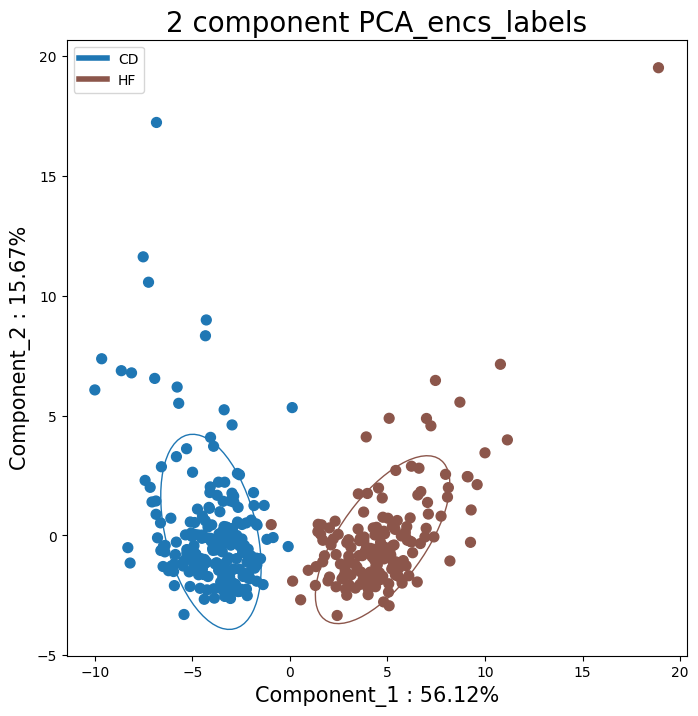

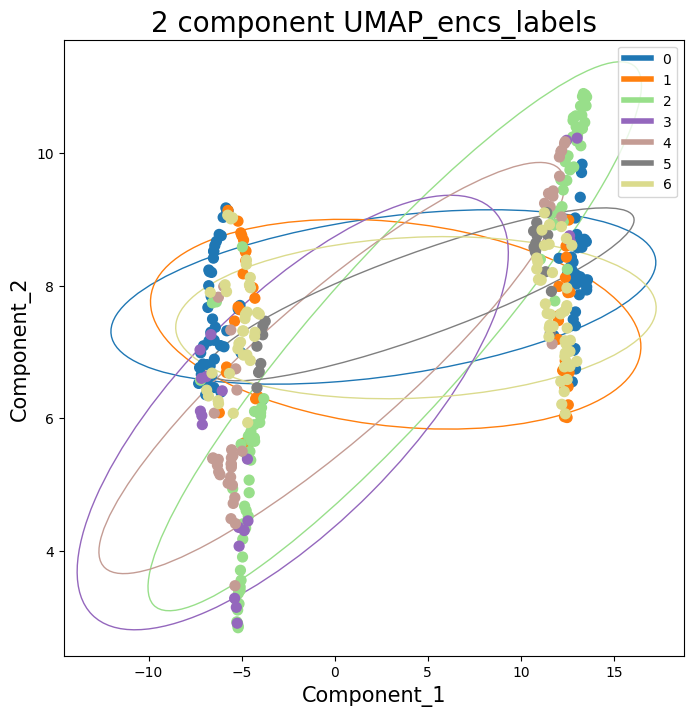

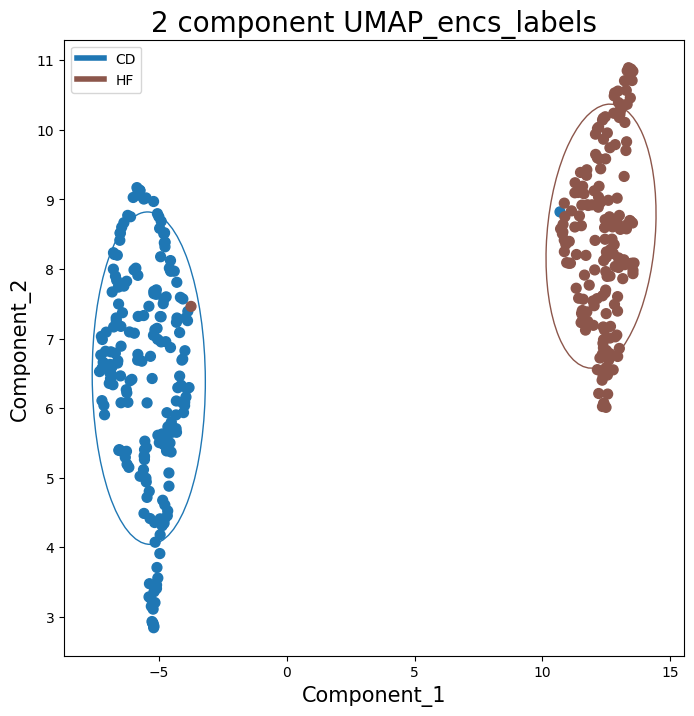

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
n_meta

0

In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-enc', n_meta)
    train_linsvc(enc_data, 'ae-enc', n_meta)
    # train_logreg(enc_data, 'ae-enc', n_meta)
    

# AEDANN

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/DANN_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  1.64059e-55  61
-----  -----------  --
ttests
-----  -  --
CD_HF  0  61
-----  -  --


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'aedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'aedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

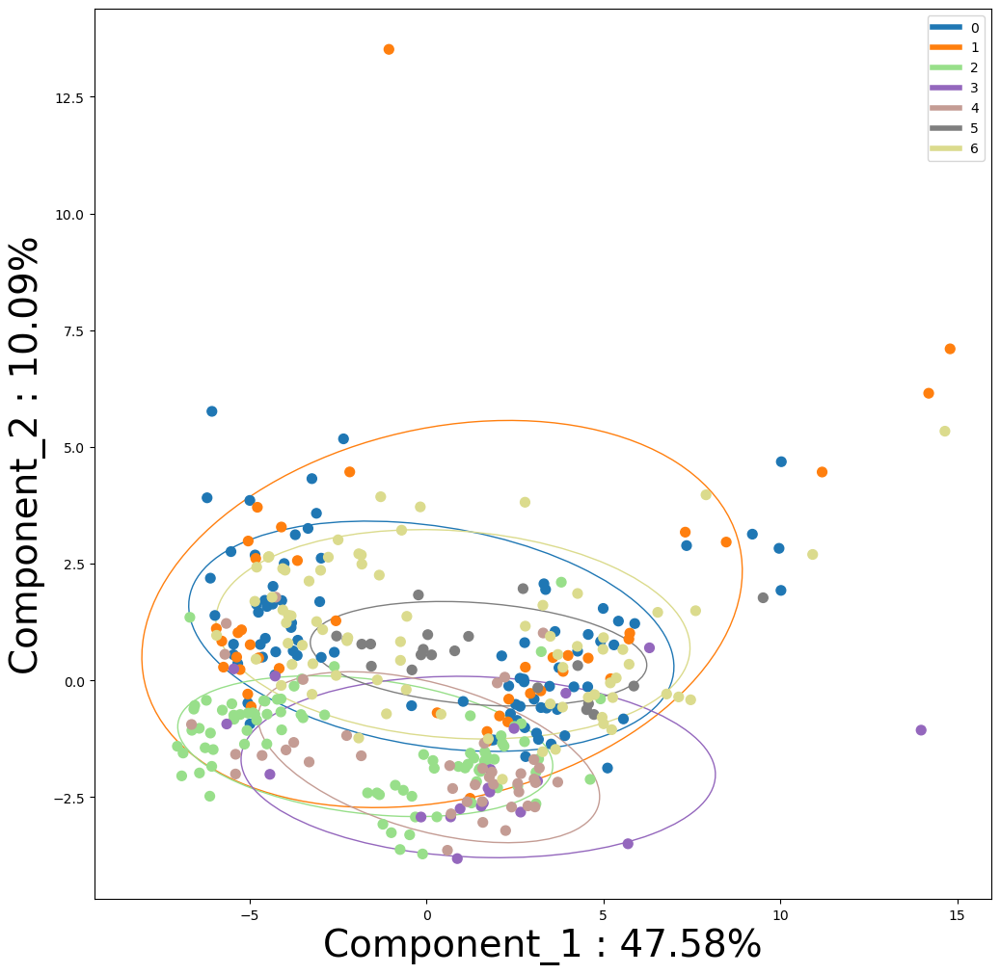

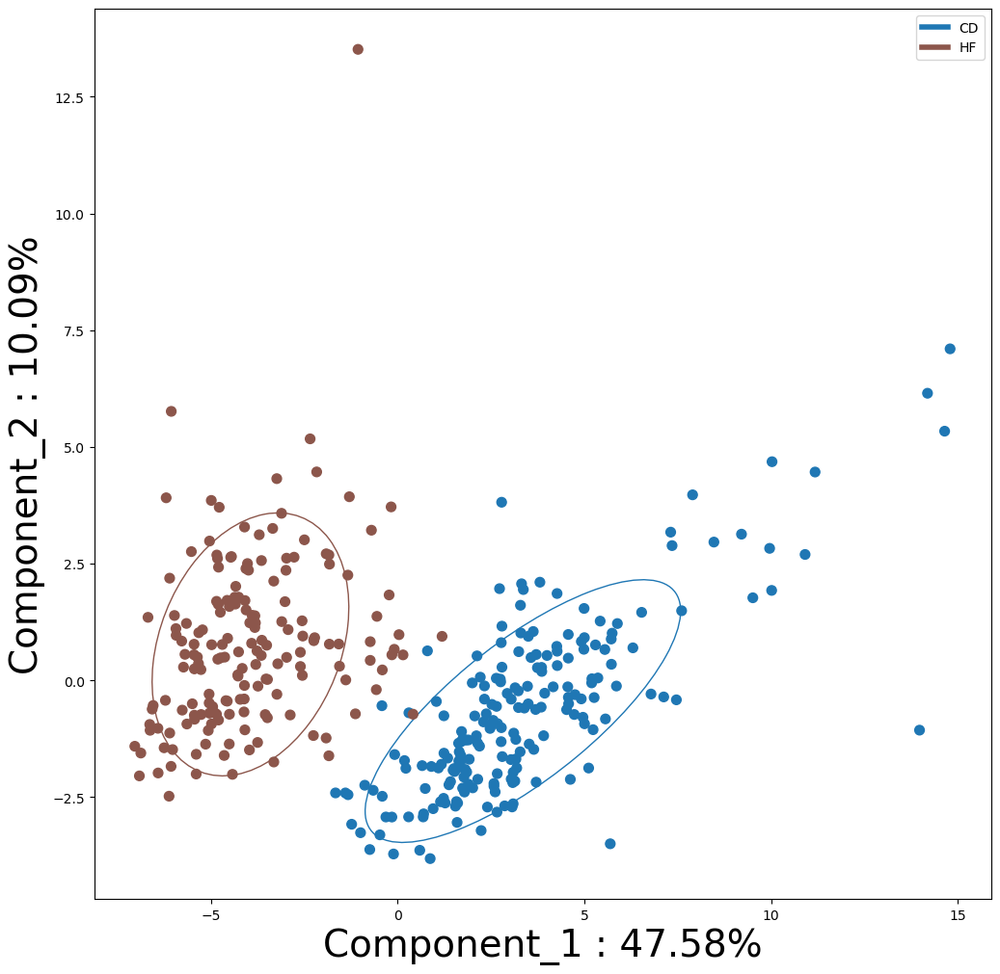

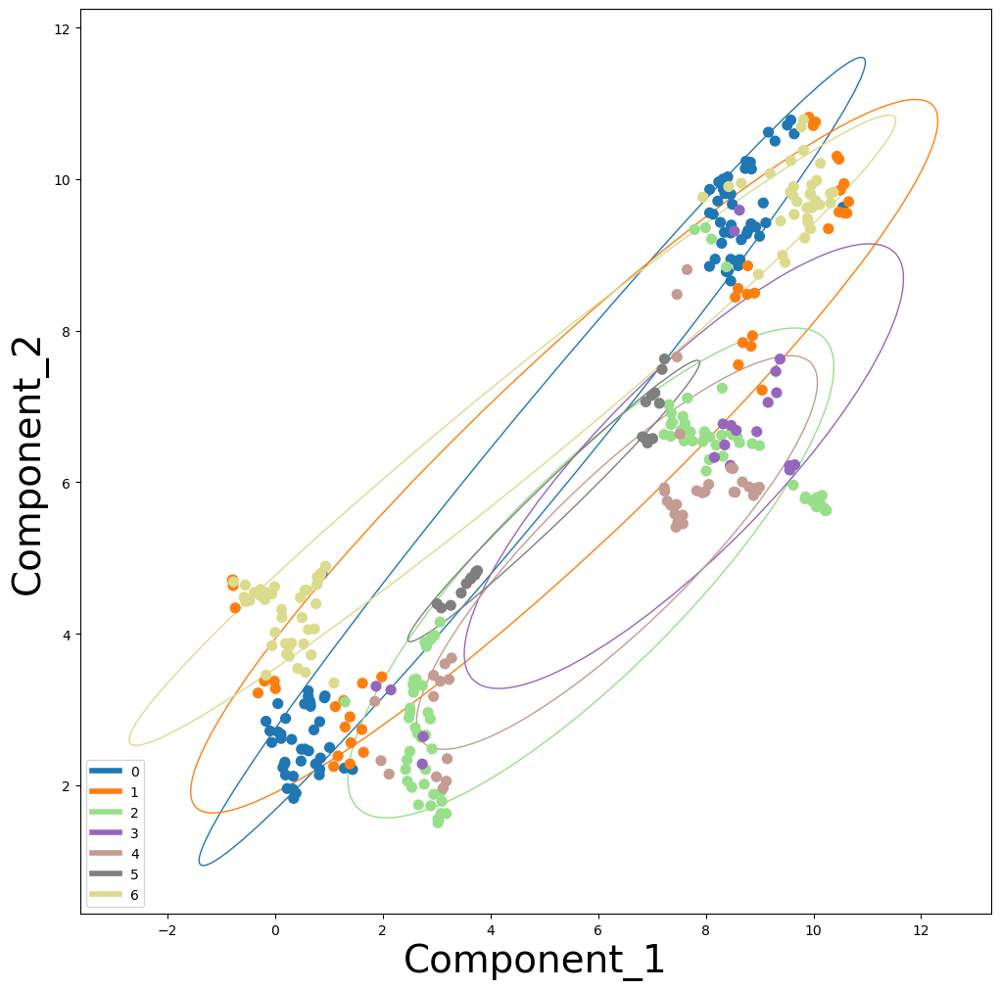

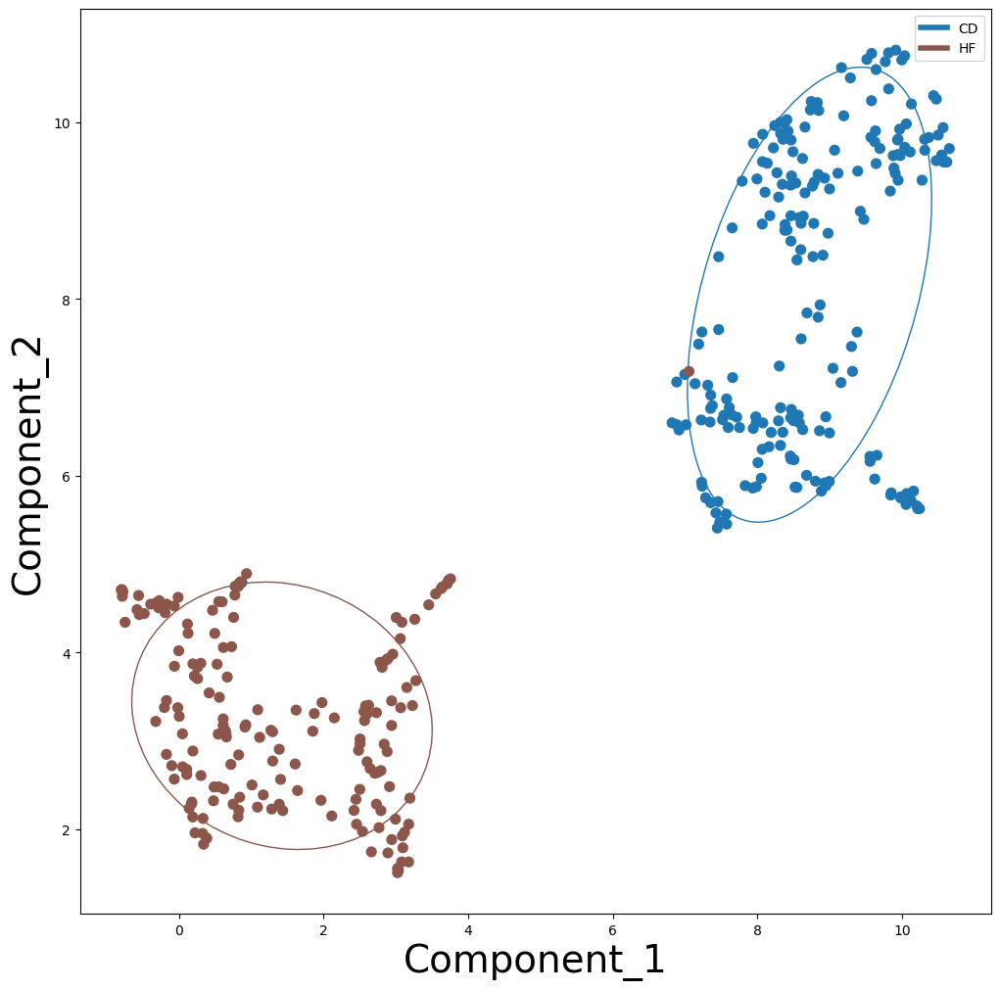

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
if train_models:
    train_rfc(enc_data, 'aedann-enc', n_meta)
    train_linsvc(enc_data, 'aedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# AE-invTriplet

## Encoded

In [ ]:
data, unique_labels, unique_batches = get_mice('data', remove_zeros=1, groupkfold=1, seed=1)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/inverseTriplet_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  1.11908e-60  63
-----  -----------  --
ttests
-----  -  --
CD_HF  0  63
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-invTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-invTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


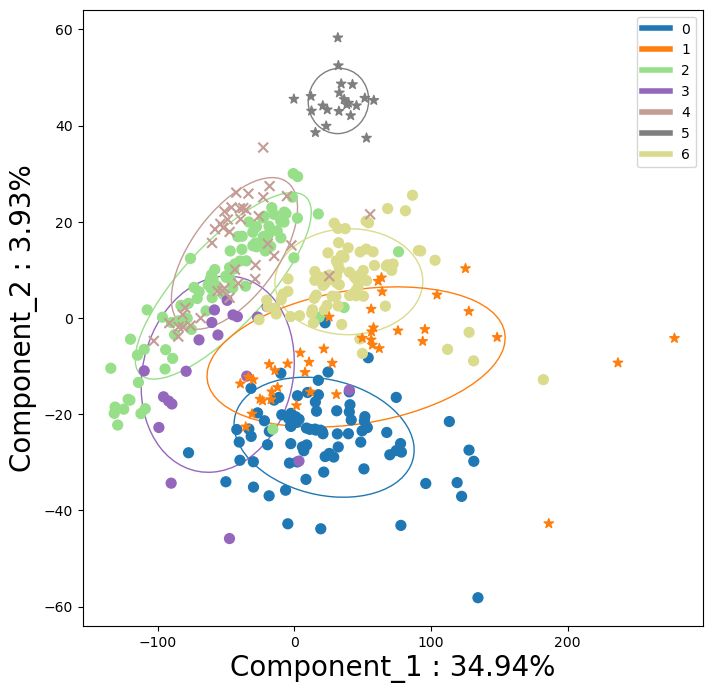

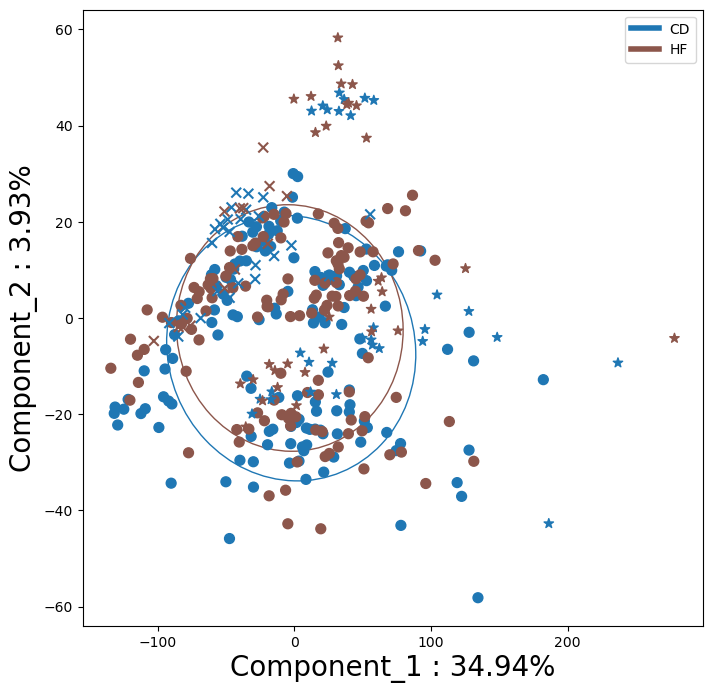

inputs train
inputs valid
inputs test
batches train
batches valid
batches test
labels train
labels valid
labels test


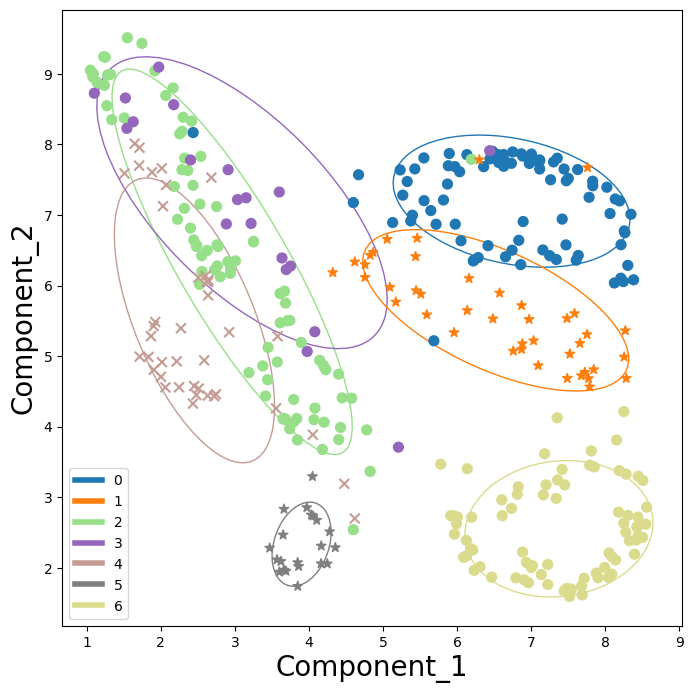

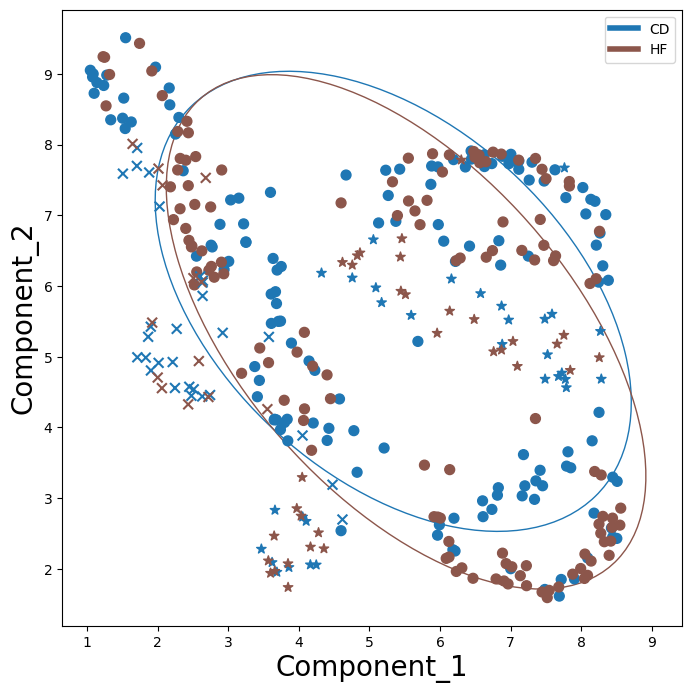

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-invTriplet-enc', n_meta)
    train_linsvc(enc_data, 'ae-invTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# AE-revTriplet

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/revTriplet_vae0/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=0, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  7.07689e-10  56
-----  -----------  --
ttests
-----  ----------  --
CD_HF  8.7153e-05  31
-----  ----------  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'ae-revTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'ae-revTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1))


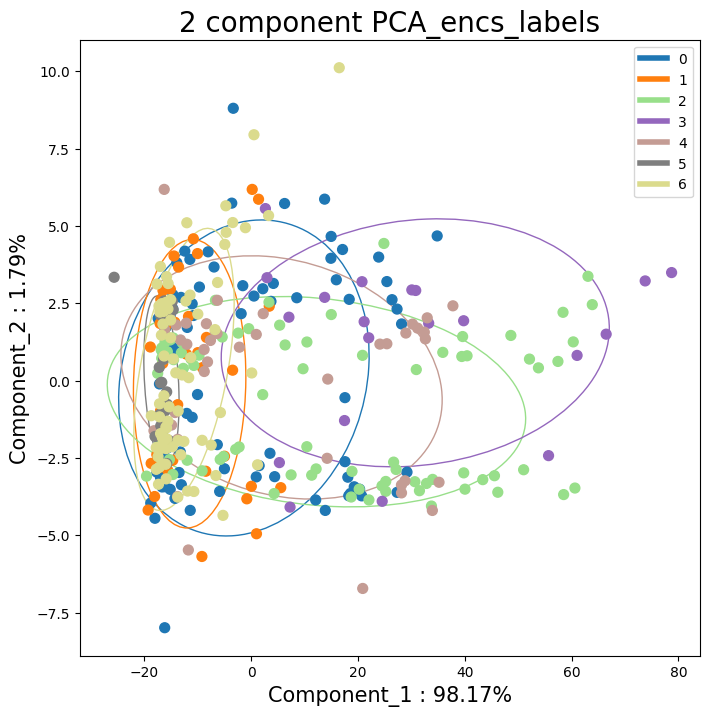

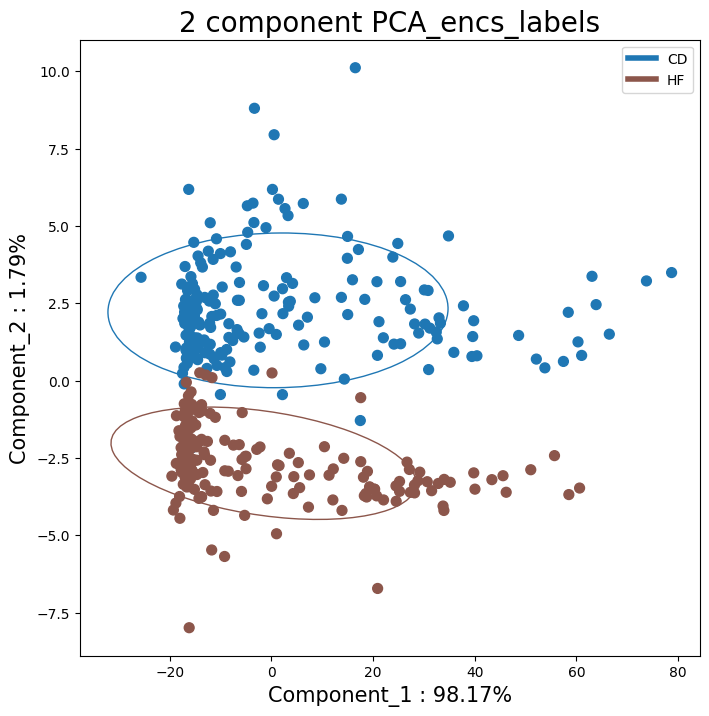

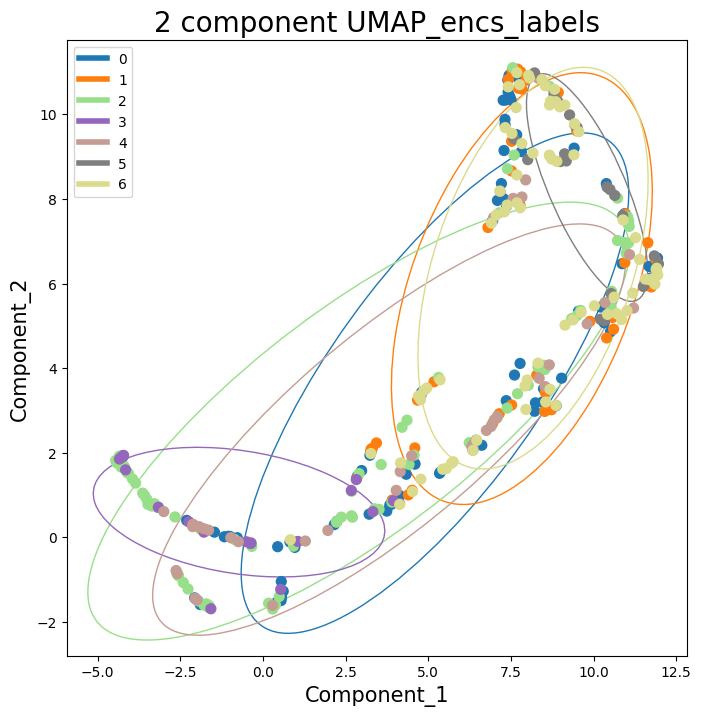

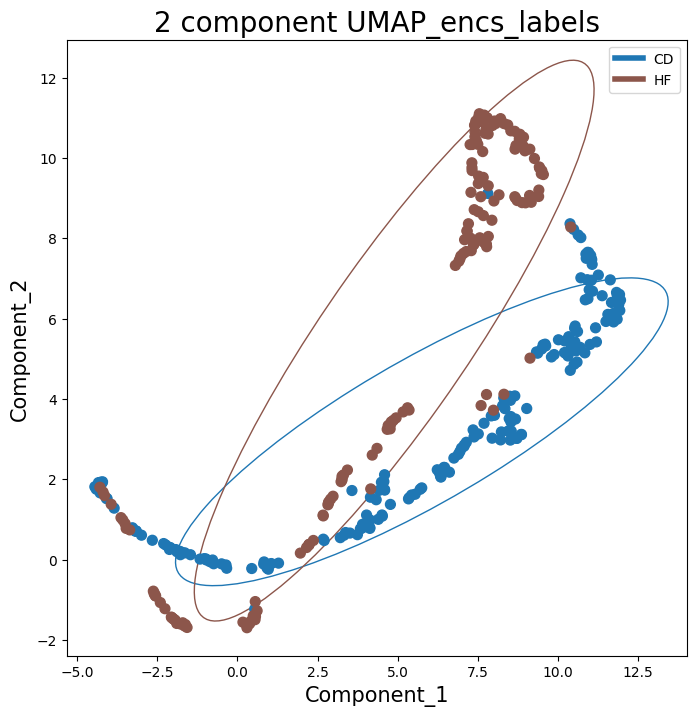

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
if train_models:
    train_rfc(enc_data, 'ae-revTriplet-enc', n_meta)
    train_linsvc(enc_data, 'ae-revTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# NORMVAE

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/normae_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  3.76011e-51  51
-----  -----------  --
ttests
-----  -  --
CD_HF  0  51
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'normvae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'normvae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'vae-enc')


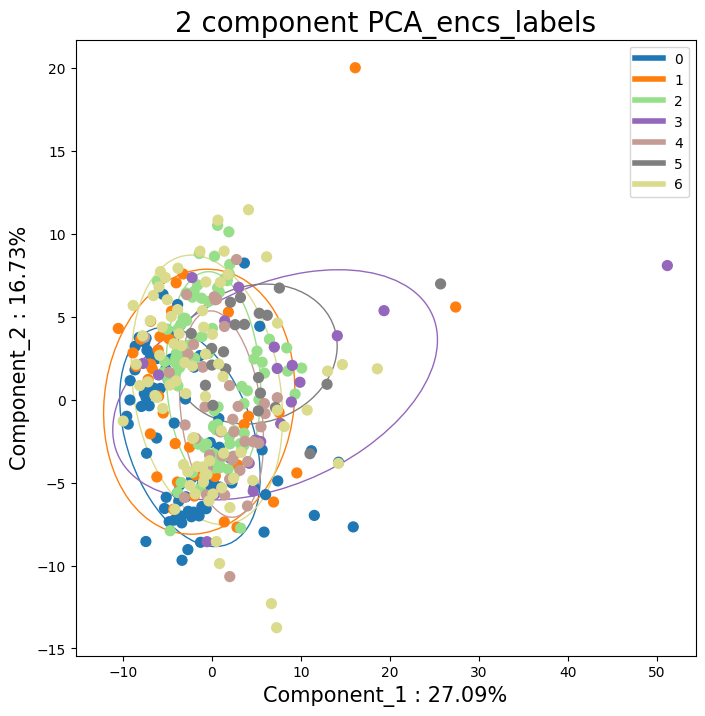

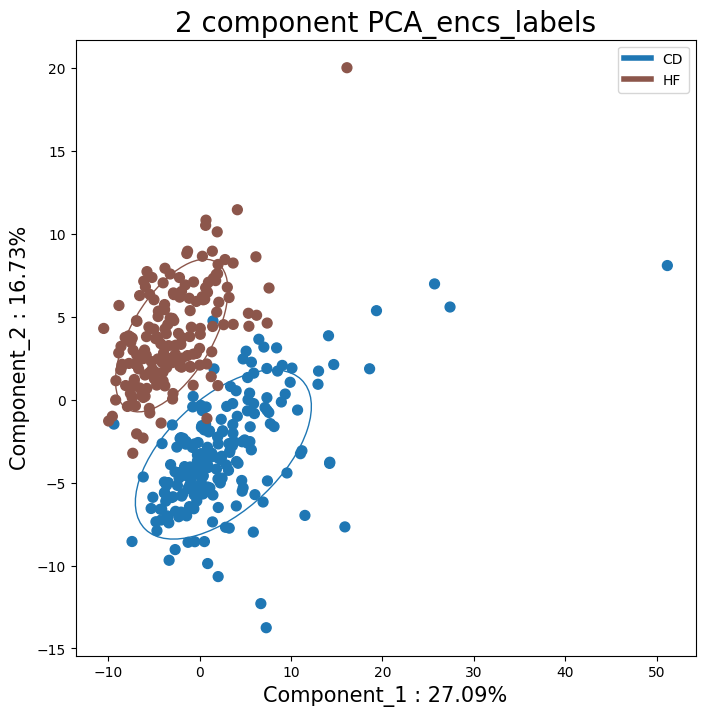

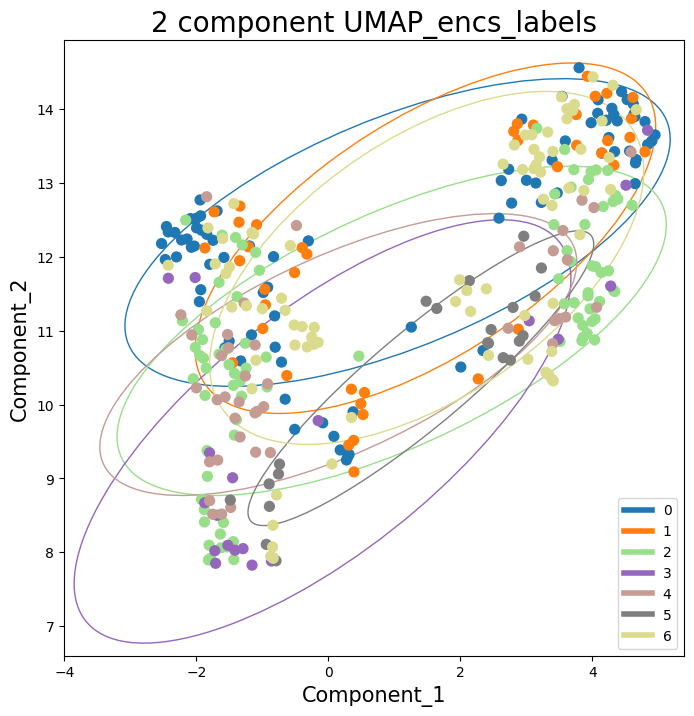

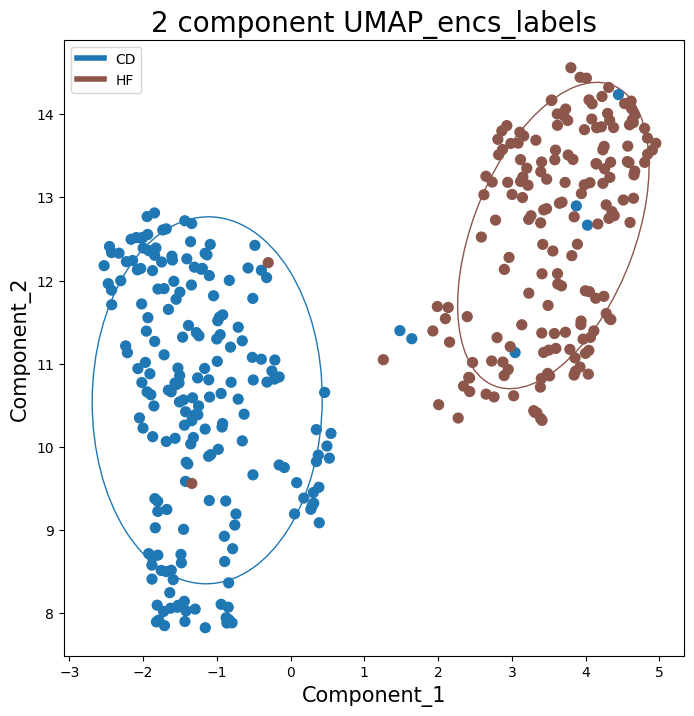

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-enc', n_meta)
    train_linsvc(enc_data, 'vae-enc', n_meta)
    # train_logreg(enc_data, 'vae-enc', n_meta)
    

# VAE

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/no_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=1, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  3.24176e-36  56
-----  -----------  --
ttests
-----  -  --
CD_HF  0  56
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vae-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vae-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'vae-enc')


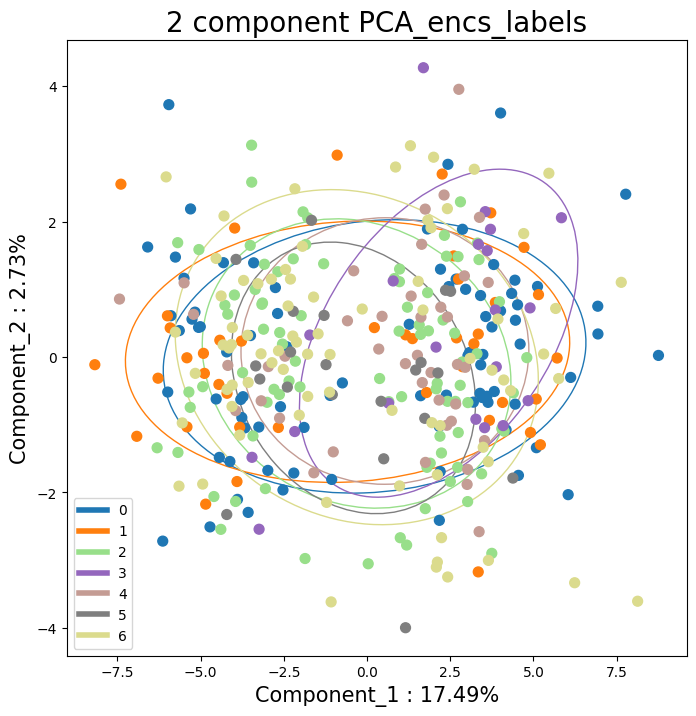

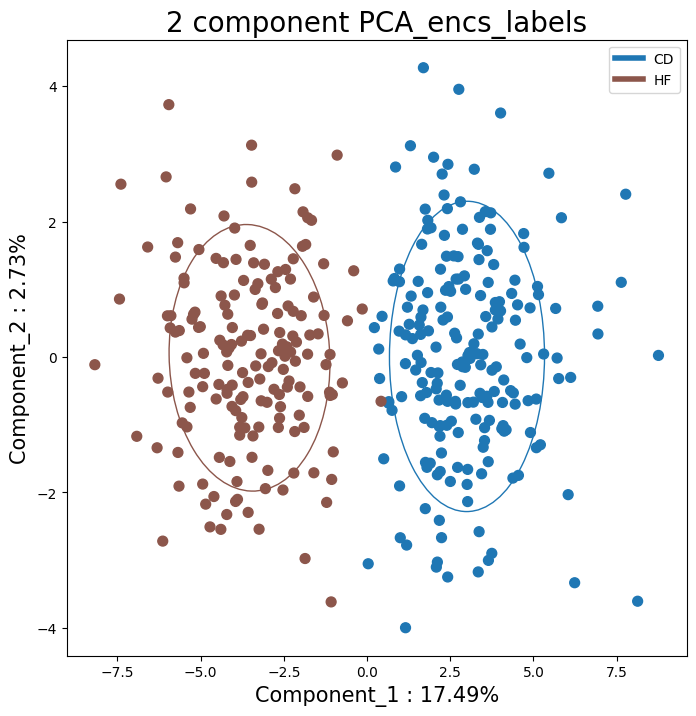

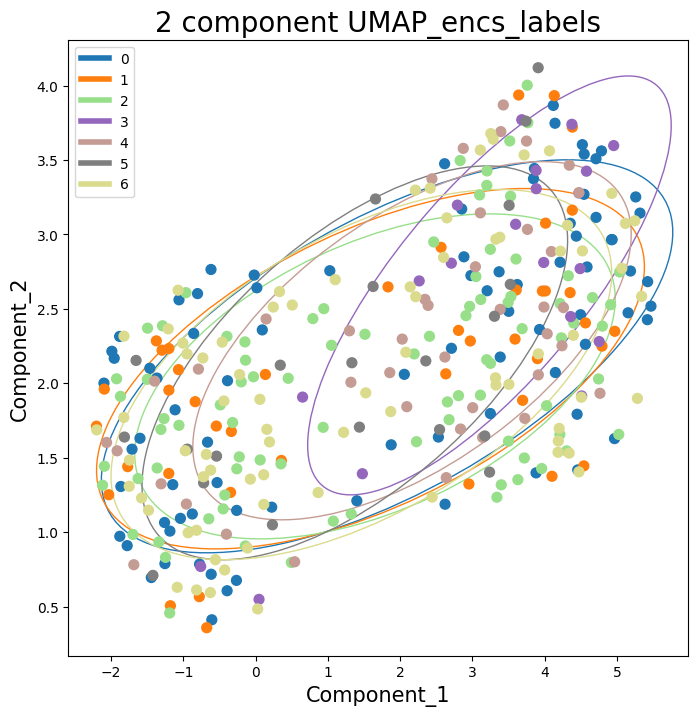

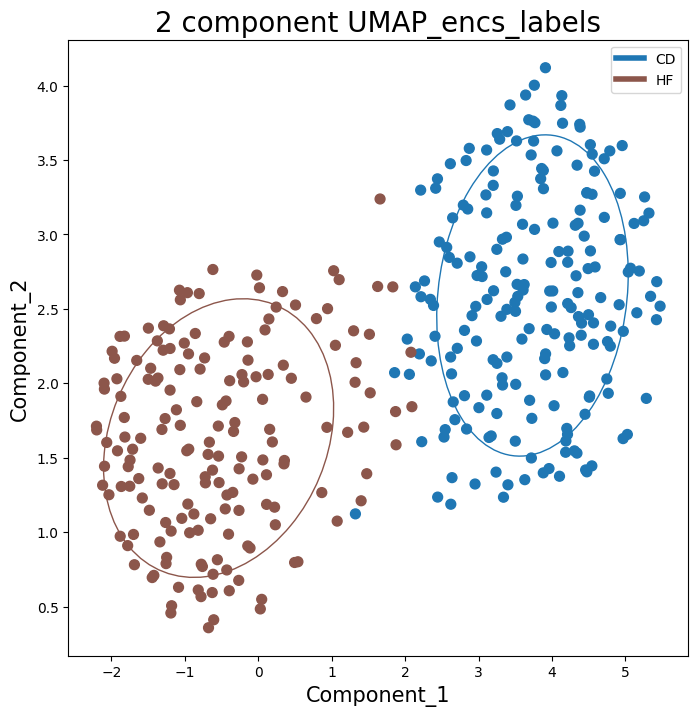

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group], enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-enc', n_meta)
    train_linsvc(enc_data, 'vae-enc', n_meta)
    # train_logreg(enc_data, 'vae-enc', n_meta)
    

# VAEDANN

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/DANN_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  ----------  --
CD_HF  2.7803e-30  56
-----  ----------  --
ttests
-----  -----------  --
CD_HF  6.83122e-35  55
-----  -----------  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vaedann-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vaedann-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

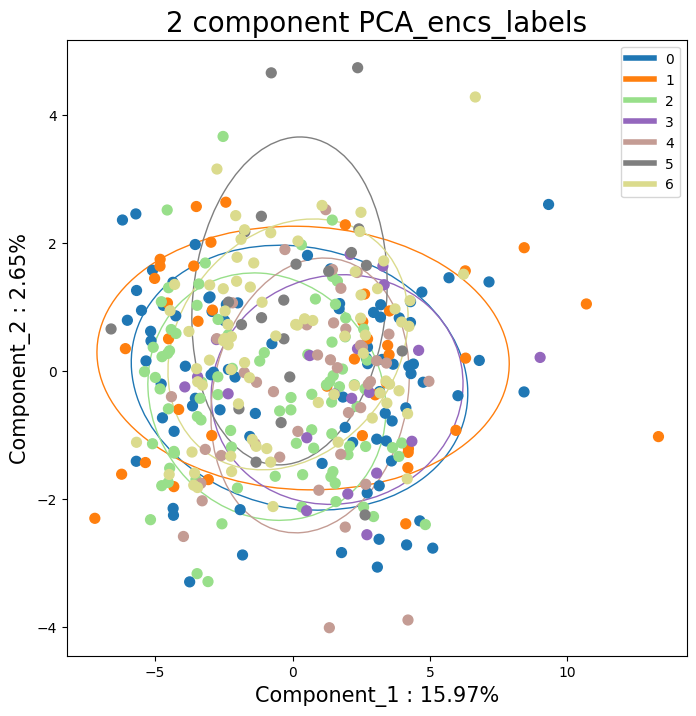

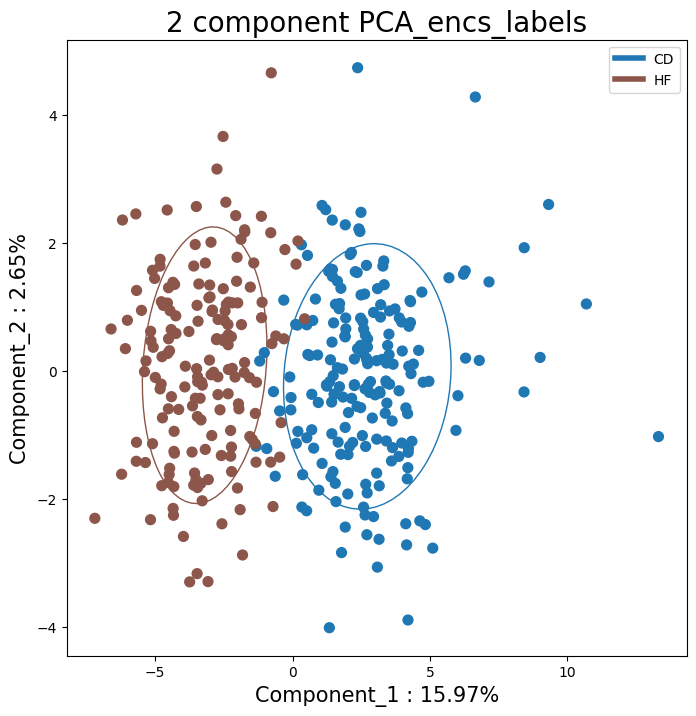

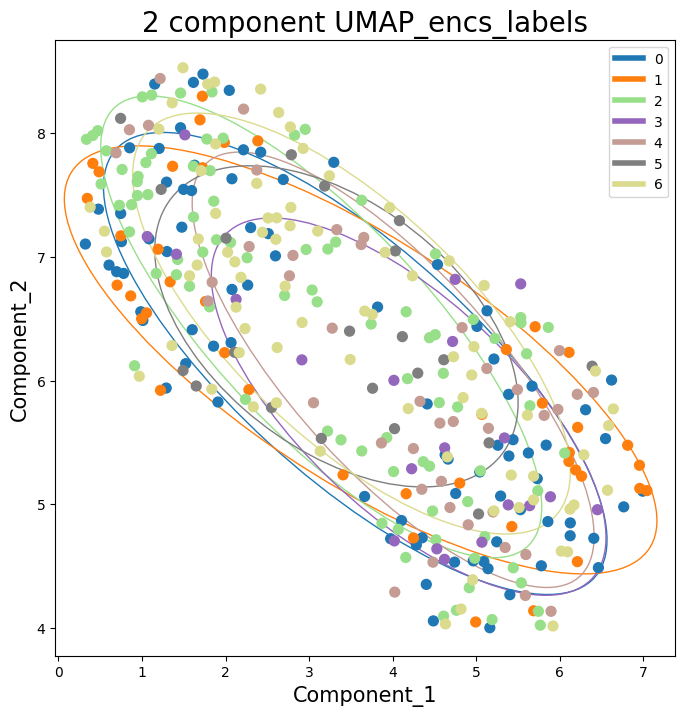

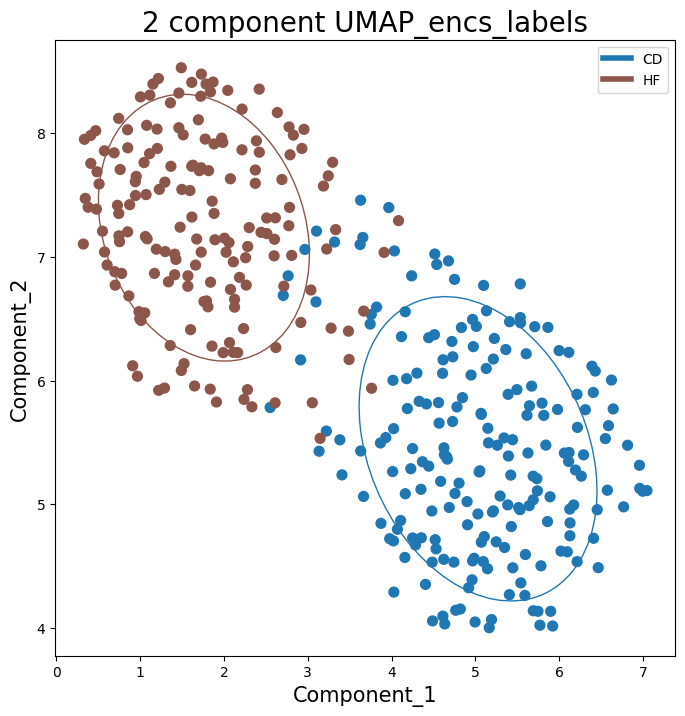

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'vaedann-enc', n_meta)
    train_linsvc(enc_data, 'vaedann-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# VAE-invTriplet

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/inverseTriplet_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  7.04255e-34  56
-----  -----------  --
ttests
-----  -----------  --
CD_HF  1.02583e-40  58
-----  -----------  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vae-invTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vae-invTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

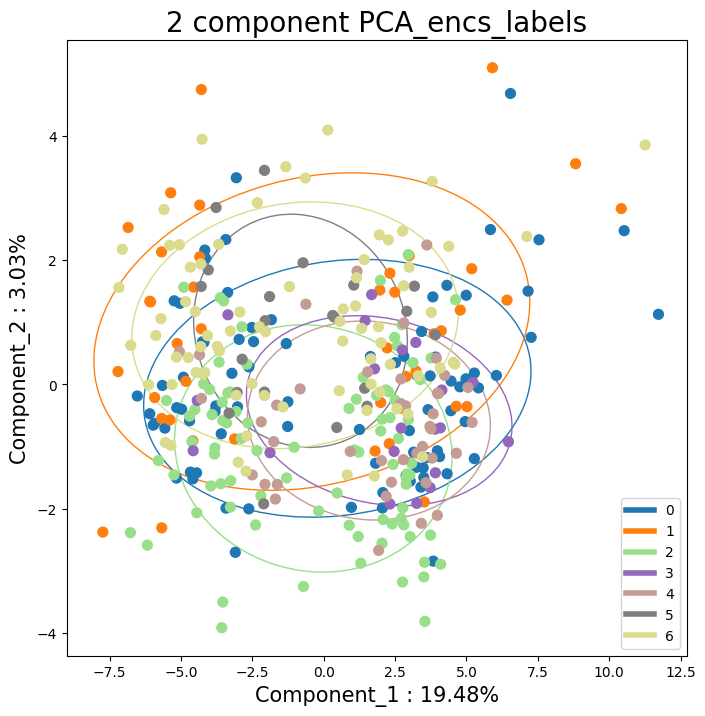

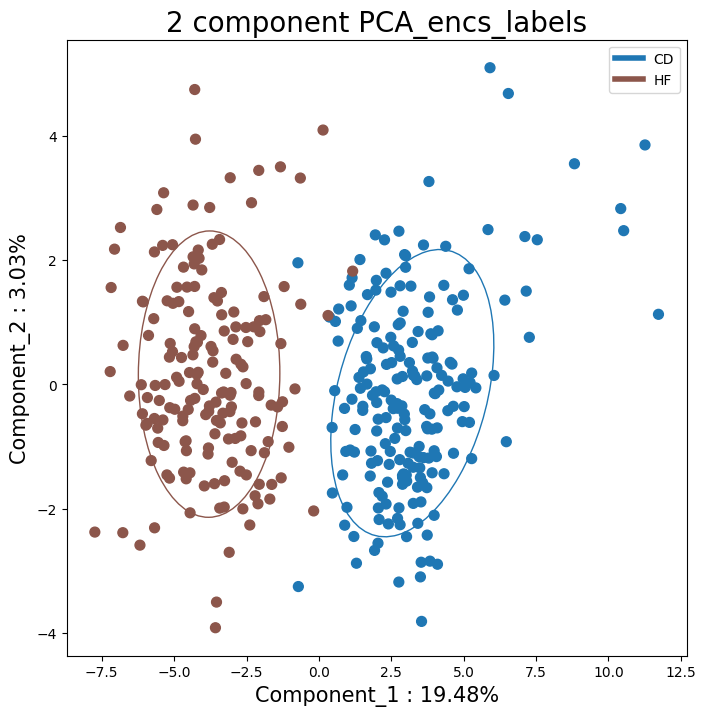

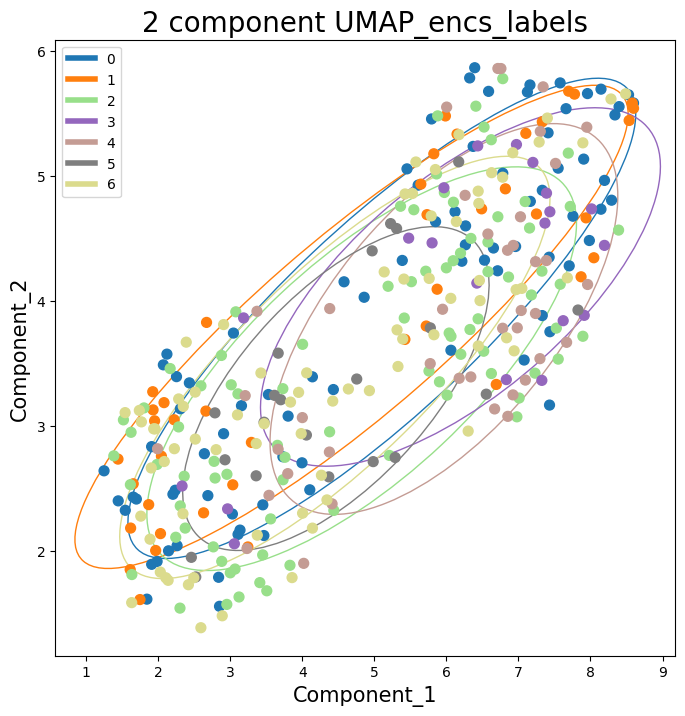

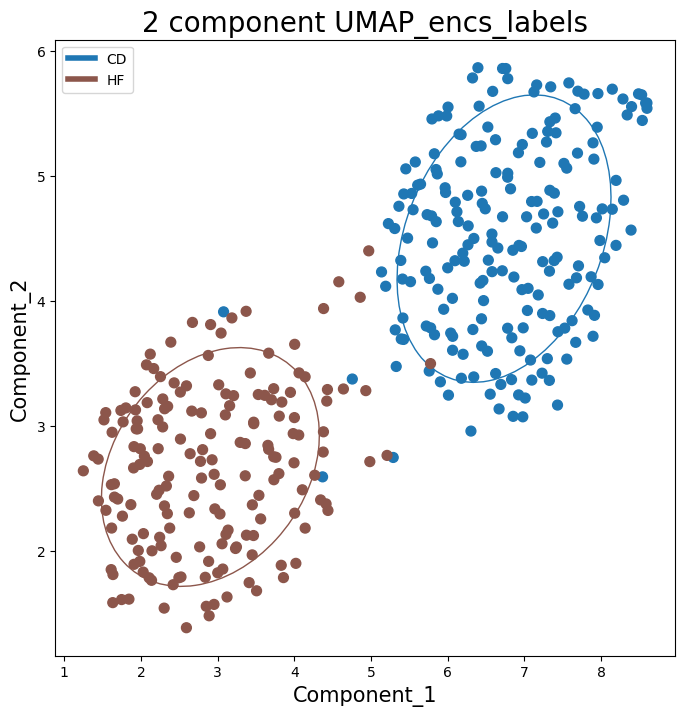

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-invTriplet-enc', n_meta)
    train_linsvc(enc_data, 'vae-invTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# VAE-revTriplet

## Encoded

In [ ]:
data, unique_labels = get_mice('data', remove_zeros=1, groupkfold=1, seed=42)
unique_batches = np.unique(data['batches']['all'])
unique_labels = unique_cats = np.unique(data['labels']['all'])
n_cats = len(unique_labels)
n_batches = len(unique_batches)

data, _ = scale_data('standard', data, device='cpu')

if not best_correction:
    # Best score run Brain-1446
    path='logs/best_models_server/ae_classifier_holdout/mice/revTriplet_vae1/model_1.pth'
else:
    # Run Brain-
    path='logs/ae_classifier_holdout/.../model_3.pth'
    
# best score is autoencoder0, best correction autoencoder3
if not best_correction:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                     n_batches=7,
                     nb_classes=2,
                     layer1=1862,
                     mapper=0,
                     layer2=63,
                     dropout=0,
                     n_meta=0,
                     n_emb=0,
                     n_layers=1,
                     variational=1, conditional=False, zinb=0,
                     add_noise=0, tied_weights=0, 
                     use_gnn=0, device='cpu').to('cpu')
else:
    best_ae2 = AutoEncoder(data['inputs']['all'].shape[1],
                 n_batches=7,
                 nb_classes=2,
                 layer1=595,
                 mapper=0,
                 layer2=266,
                 dropout=0,
                 variational=0, conditional=False, zinb=0,
                 add_noise=0, tied_weights=0, n_meta=2,
                 use_gnn=0, device='cpu').to('cpu')

best_ae2.mapper.to('cpu')
best_ae2.dec.to('cpu')

best_ae2.load_state_dict(torch.load(f'{path}', map_location='cpu'))
best_ae2.eval()
pass

In [ ]:
batches = torch.Tensor([np.argwhere(unique_batches == x)[0][0] for x in data['batches']['all']]).detach().cpu()
enc_data = data.copy()
enc_data['inputs']['all'], _, _, _ = best_ae2.cpu()(torch.Tensor(data['inputs']['all'].values), batches, sampling=True)

enc_data['inputs']['all'] = pd.DataFrame(enc_data['inputs']['all'].detach().cpu().numpy())


In [ ]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
print("Mann      pval min    n pvals < 0.05")
table = pd.DataFrame(columns=['pval', 'n'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.mannwhitneyu(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))

print('ttests')
table = pd.DataFrame(columns=['pval'])
i = 0
for i, label in enumerate(unique_labels[:-1]):
    for label2 in unique_labels[i+1:]:
        if label != label2 and label != 'pool' and label2 != 'pool':
            pvals = stats.ttest_ind(
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label).squeeze()], 
                enc_data['inputs']['all'].values[np.argwhere(data['labels']['all'] == label2).squeeze()]
            )
            tmp = multipletests(pvals[1], 0.05, 'fdr_bh')[1]
            table.loc[f'{label}_{label2}', 'pval'] = tmp.min()
            table.loc[f'{label}_{label2}', 'n'] = len([x for x in tmp if x < 0.05])
            i += 1
print(tabulate(table))


Mann      pval min    n pvals < 0.05
-----  -----------  --
CD_HF  2.32596e-54  56
-----  -----------  --
ttests
-----  -  --
CD_HF  0  56
-----  -  --


In [ ]:
if log_stuff:
    # metrics = log_pool_metrics(enc_data['inputs'], enc_data['batches'], metrics, 'vae-revTriplet-enc')
    metrics = log_metrics(enc_data, unique_labels, enc_data['batches'], metrics, 'vae-revTriplet-enc', device='cuda')
    # metrics = log_LDA(LDA, enc_data, {'batches': unique_batches, 'labels': unique_labels}, 0, metrics, 'aedann-enc')
    

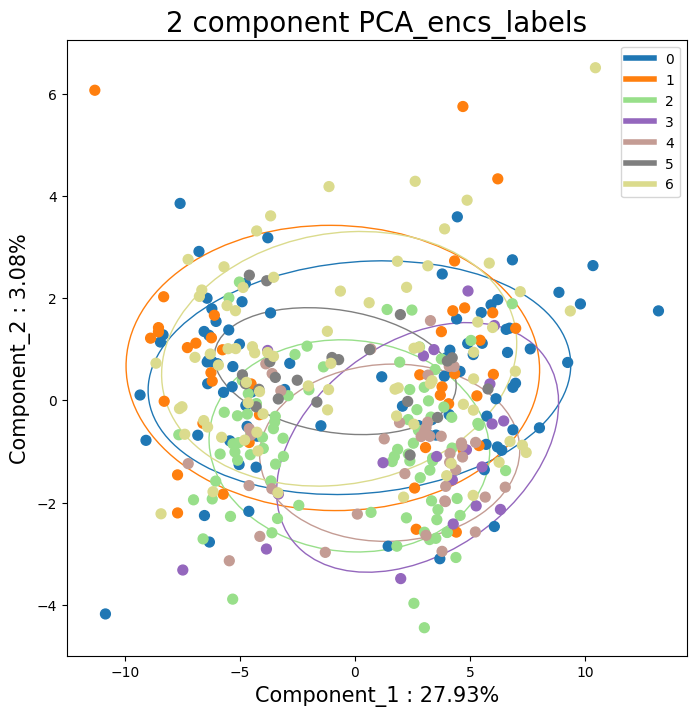

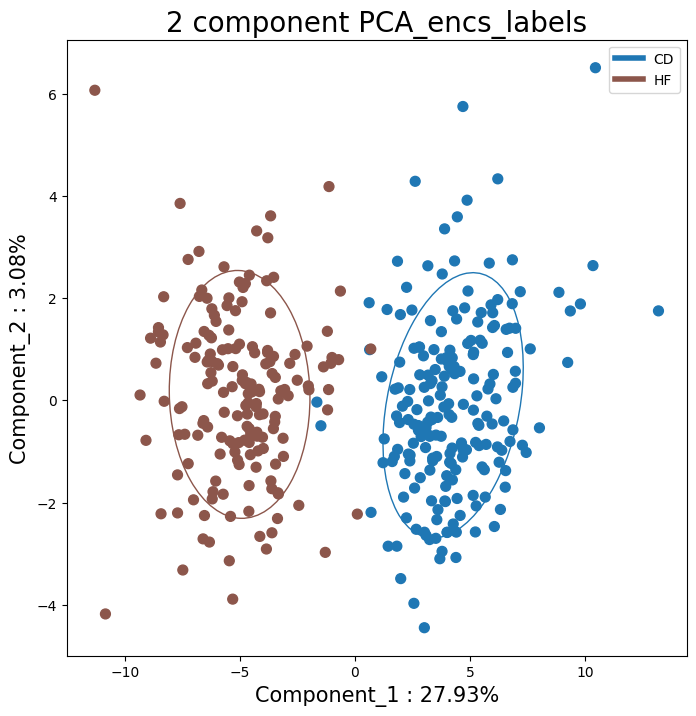

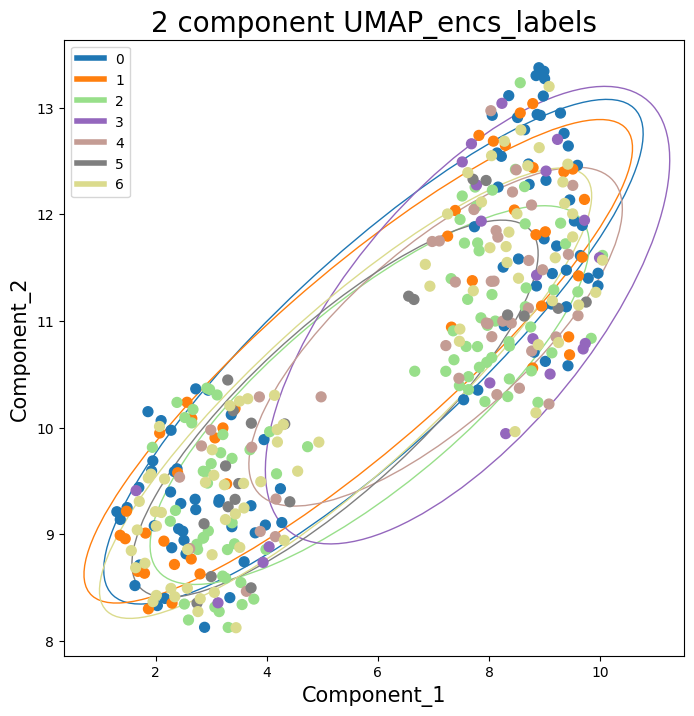

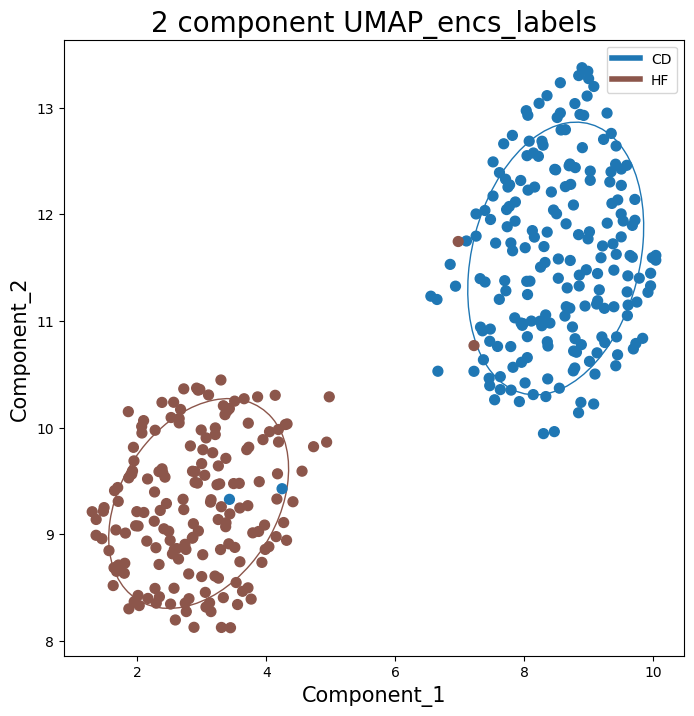

In [ ]:
%matplotlib inline
log_ORD({'model': PCA(n_components=2), 'name': f'PCA_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)
log_ORD({'model': UMAP(n_components=2), 'name': f'UMAP_encs_labels'}, enc_data, 
        {'batches': unique_batches, 'labels': unique_labels, 
         # 'age': unique_ages
        }, 0)


In [ ]:
for group in enc_data['inputs']:
    if n_meta == 2:
        enc_data['inputs'][group] = pd.DataFrame(np.concatenate((enc_data['inputs'][group].values, enc_data['meta'][group]), 1))


In [ ]:
if train_models:
    train_rfc(enc_data, 'vae-revTriplet-enc', n_meta)
    train_linsvc(enc_data, 'vae-revTriplet-enc', n_meta)
    # train_logreg(enc_data, 'aedann-enc', n_meta)
    

# Table

In [ ]:
if log_stuff:
    # table = pd.DataFrame(columns=list(metrics['raw']['all'].keys()) + ['delta', 'delta_pool'], index=list(metrics.keys()))
    cols = ['lisi', 'silhouette', 'kbet', 'shannon', 'adjusted_rand_score', 'adjusted_mutual_info_score']
    table = pd.DataFrame(columns=cols, index=list(metrics.keys()))
    # table = table.drop(['qc_dist', 'b_euclidean', 'euclidean', "[b_euclidean/tot_eucl]"], 1)
    for col in cols:
        for row in list(table.index):
            # if 'delta' in col:
            #     table[col][row] = metrics[row][col]
            # else:
            try:
                if isinstance(metrics[row]['all'][col], dict):
                    table[col][row] = metrics[row]['all'][col]["domains"]
                    try:
                        # print(col, f'pool {row}', metrics[row]['all_pool'][col]["domains"])
                        table[f'pool {col}'][row] = metrics[row]['all_pool'][col]["domains"]
                    except:
                        pass
                    # table[col][row]["domains"] = metrics[row]['all'][col]["domains"]
                    # table[col][row]["labels"] = metrics[row]['all'][col]["labels"]
                else:
                    try:
                        table[col][row] = metrics[row]['valid'][col]
                    except:
                        table[col][row] = metrics[row]['all'][col]

            except:
                try:
                    table[col][row] = metrics[row]['all_pool'][col]
                except:
                    table[col][row] = metrics[row]['all'][col]

table

,lisi,silhouette,kbet,shannon,adjusted_rand_score,adjusted_mutual_info_score
raw,4.347366,0.047008,0.297989,0.242797,0.78363,0.818056
minmax,4.541349,0.047866,0.226918,0.235326,0.809809,0.835449
minmax_per_batch,4.618816,0.07711,0.367668,0.244941,0.749553,0.791972
standard,4.295212,0.035693,0.190998,0.362665,0.735547,0.779283
standard_per_batch,4.657737,-0.016037,0.008425,1.171385,0.014476,0.051643
robust,4.713557,-0.002084,0.872319,0.528497,0.261142,0.518879
robust_per_batch,4.42098,-0.093883,0.939015,0.476775,-0.004012,0.008826
combat,1.143728,-0.01911,0.0,1.495775,-0.002361,-0.002861
pycombat,4.207946,-0.068065,0.279923,1.27022,-0.001333,0.003963
ae-enc,2.982367,-0.054945,0.0,0.873144,0.616016,0.682697
